# Proyecto Marketing Analytics – Fintech (Priorización pre-contacto)

## 📑 Tabla de contenidos
1. [Objetivos (negocio y analítico)](#objetivos-negocio-y-analítico)
2. [Datos y Calidad (EDA + outliers)](#datos-y-calidad-eda--outliers)
3. [Modelado (pipeline, CV, calibración)](#modelado-pipeline-cv-calibración)
4. [Selección de umbral (F1 vs negocio) + Ganancia](#selección-de-umbral-f1-vs-negocio--ganancia)
5. [Scoring OOF, Deciles, Lift & Gain](#scoring-oof-deciles-lift--gain)
6. [Diagnóstico de errores (FN/FP) por segmentos](#diagnóstico-de-errores-fnfp-por-segmentos)
7. [Estabilidad temporal (mes) y deriva simple](#estabilidad-temporal-mes-y-deriva-simple)
8. [Export a BI (Power BI / Looker) + KPIs](#export-a-bi-power-bi--looker--kpis)
9. [Checklist de despliegue y operación](#checklist-de-despliegue-y-operación)
10. [Conclusiones y roadmap](#conclusiones-y-roadmap)


In [1]:
#from google.colab import drive

In [2]:
#drive.mount('/content/drive')

## Objetivos (negocio y analítico)
<a id="objetivos-negocio-y-analítico"></a>

Aquí va el detalle de objetivos…


## Importación de librerías y funciones definidas por usuario

Librerías

In [3]:
import numpy
print(numpy.__version__)
print(numpy.__file__)

2.1.3
/home/augusto/anaconda3/envs/py311/lib/python3.11/site-packages/numpy/__init__.py


In [4]:
# Librerías estándar
import os
import warnings
import math

# Manipulación de datos
import pandas as pd
import numpy as np

# Configuración de warnings
warnings.filterwarnings('ignore')

# Análisis de nulos
import missingno as msno

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# EDA
#!pip install ydata-profiling
from ydata_profiling import ProfileReport

# Textos
import unicodedata
#!pip install fuzzywuzzy
#from fuzzywuzzy import process
import re

# Preprocesamiento de datos y ML
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_validate, train_test_split, GroupKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, precision_score, recall_score, roc_auc_score, classification_report, confusion_matrix, precision_recall_curve
from sklearn.impute import SimpleImputer


# Evaluacion
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import (
    brier_score_loss, precision_recall_curve, classification_report,
    confusion_matrix, f1_score, precision_score, recall_score, precision_recall_curve, roc_curve, auc, ConfusionMatrixDisplay

)
from joblib import dump
from sklearn.base import clone

# warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#!pip install gdown



Funciones:

In [5]:
'''

link = 'https://drive.google.com/file/d/1X-pn19tXQSeQVVwzTRdNOs7mnapgLA_u/view?usp=drive_link'

import pandas as pd

# to get the id part of the file
id = link.split("/")[-1]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('bank_loans.csv')

df = pd.read_csv('bank_loanz.csv')
print(df)

'''

'\n\nlink = \'https://drive.google.com/file/d/1X-pn19tXQSeQVVwzTRdNOs7mnapgLA_u/view?usp=drive_link\'\n\nimport pandas as pd\n\n# to get the id part of the file\nid = link.split("/")[-1]\n\ndownloaded = drive.CreateFile({\'id\':id})\ndownloaded.GetContentFile(\'bank_loans.csv\')\n\ndf = pd.read_csv(\'bank_loanz.csv\')\nprint(df)\n\n'

In [6]:
import sys
#sys.path.append('/content/drive/MyDrive/NUCLIO/TFM/02_scripts') #de uso solo del propietario
#sys.path.append('/content/drive/MyDrive/Colab_Notebooks/funciones') #de uso en colab Fernando, no borrar, solo comentar!
sys.path.append('/home/augusto/Documents/nuclio/entregables/TFM/02_scripts')
from funciones import *
#import funciones as f

##########################################################################################


## Importar datos


In [7]:
#path = '/content/drive/MyDrive/NUCLIO/TFM/00_data/raw' #ruta especifica para el drive de Augusto, NO TOCAR
path = '/content/drive/MyDrive/Colab_Notebooks' #por definir como podemos tener acceso todos al mismo archivo csv. Aqui cada quien puede comentar el path anterior y usar el que aplica para su propio drive
path = '/home/augusto/Documents/nuclio/entregables/TFM/00_data/raw'

# 2. Lista todos los archivos del directorio
lista = os.listdir(path)

# 3. Filtra solo los archivos .csv (opcional)
csv_files = [file for file in lista if (file.endswith('.csv') | file.endswith('.xlsx'))]

csv_files = sorted(csv_files)
csv_files

['bank-additional_bank-additional-full.csv']

In [8]:
diccionario_datos = {}

for file in csv_files:
  ruta = os.path.join(path, file)

  if file.endswith('.xlsx'):
    df = pd.read_excel(ruta)
  elif file.endswith('.csv'):
    df = pd.read_csv(ruta, sep = ';')  # o read_excel(), etc.

  key = file.split('.')[0]
  #key = file.split('t_')[1].split('.')[0]
  diccionario_datos[key] = df
  print(f"{key}: {df.shape}")  # ejemplo: mostrar nombre y dimensiones

bank-additional_bank-additional-full: (41188, 21)


## Datos y Calidad (EDA + outliers)
<a id="datos-y-calidad-eda--outliers"></a>

EDA con exploración de variables, valores nulos, etc…


BANK-ADDITIONAL_BANK-ADDITIONAL-FULL
False
¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 41,188 filas y 21 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las últimas cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74,retired,married,professional.course,no,yes,no,cellular,nov,fri,239,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,no


----------------------------------------------------------------------------------------------------
¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
19612,39,admin.,married,university.degree,no,no,no,cellular,aug,thu,436,2,999,0,nonexistent,1.4,93.444,-36.1,4.968,5228.1,no
32286,32,blue-collar,single,basic.9y,no,no,no,cellular,may,fri,120,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
7798,48,technician,married,high.school,no,no,no,telephone,jun,mon,185,2,999,0,nonexistent,1.4,94.465,-41.8,4.865,5228.1,no
8725,30,blue-collar,married,basic.6y,no,no,no,telephone,jun,wed,201,2,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1,no
18365,37,blue-collar,divorced,basic.9y,no,yes,no,cellular,jul,thu,346,2,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las columnas del conjunto de datos?
	- age
	- job
	- marital
	- education
	- default
	- housing
	- loan
	- contact
	- month
	- day_of_week
	- duration
	- campaign
	- pdays
	- previous
	- poutcome
	- emp.var.rate
	- cons.price.idx
	- cons.conf.idx
	- euribor3m
	- nr.employed
	- y
----------------------------------------------------------------------------------------------------
¿Cuál es el tipo de datos de cada columna?
age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     flo

,0
age,"[56, 57, 37, 40, 45, 59, 41, 24, 25, 29, 35, 5..."
job,"[housemaid, services, admin., blue-collar, tec..."
marital,"[married, single, divorced, unknown]"
education,"[basic.4y, high.school, basic.6y, basic.9y, pr..."
default,"[no, unknown, yes]"
housing,"[no, yes, unknown]"
loan,"[no, yes, unknown]"
contact,"[telephone, cellular]"
month,"[may, jun, jul, aug, oct, nov, dec, mar, apr, ..."
day_of_week,"[mon, tue, wed, thu, fri]"


----------------------------------------------------------------------------------------------------
¿Cuáles son las estadísticas descriptivas básicas de todas las columnas?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.0,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188.0,41188.0,41188.0,41188.0,41188,41188.0,41188.0,41188.0,41188.0,41188.0,41188
unique,,12,4,8,3,3,3,2,10,5,,,,,3,,,,,,2
top,,admin.,married,university.degree,no,yes,no,cellular,may,thu,,,,,nonexistent,,,,,,no
freq,,10422,24928,12168,32588,21576,33950,26144,13769,8623,,,,,35563,,,,,,36548
mean,40.02406,,,,,,,,,,258.28501,2.567593,962.475454,0.172963,,0.081886,93.575664,-40.5026,3.621291,5167.035911,
std,10.42125,,,,,,,,,,259.279249,2.770014,186.910907,0.494901,,1.57096,0.57884,4.628198,1.734447,72.251528,
min,17.0,,,,,,,,,,0.0,1.0,0.0,0.0,,-3.4,92.201,-50.8,0.634,4963.6,
25%,32.0,,,,,,,,,,102.0,1.0,999.0,0.0,,-1.8,93.075,-42.7,1.344,5099.1,
50%,38.0,,,,,,,,,,180.0,2.0,999.0,0.0,,1.1,93.749,-41.8,4.857,5191.0,
75%,47.0,,,,,,,,,,319.0,3.0,999.0,0.0,,1.4,93.994,-36.4,4.961,5228.1,


----------------------------------------------------------------------------------------------------
¿Cuántos valores nulos hay en cada columna del DataFrame?


age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

----------------------------------------------------------------------------------------------------
¿Cuál es el porcentaje de valores nulos por columna, ordenado de mayor a menor?


,Col,pct
0,age,0.0
1,job,0.0
2,marital,0.0
3,education,0.0
4,default,0.0
5,housing,0.0
6,loan,0.0
7,contact,0.0
8,month,0.0
9,day_of_week,0.0


----------------------------------------------------------------------------------------------------
## Valores nulos: Visualización


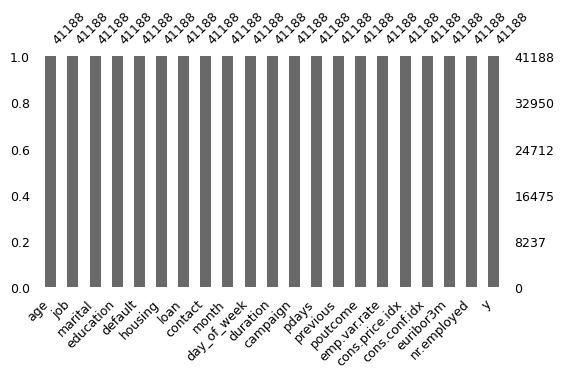

----------------------------------------------------------------------------------------------------
## Visualización de patrones en valores nulos


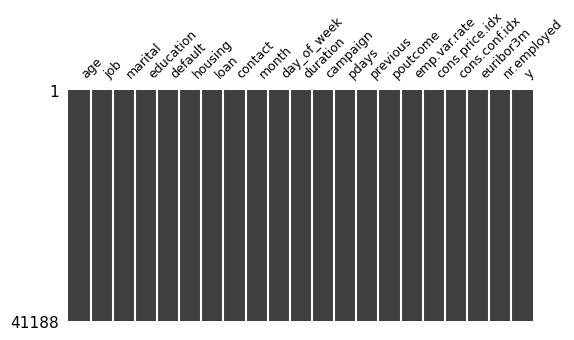

----------------------------------------------------------------------------------------------------


In [9]:
for k,v in diccionario_datos.items():
  print(k.upper())
  print('#'==90)
  exploracion_inicial(v)

In [10]:
df=diccionario_datos.get('bank-additional_bank-additional-full') #solo hay un archivo en el diccionario, definimos el df como dicho archivo

Guardamos una version del df original

In [11]:
df_original=df

# Tratamiento de datos previo a analisis

Identificacion y elinminacion de duplicados:

In [12]:
df[df.duplicated(keep=False)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


In [13]:
df.drop_duplicates(inplace = True)

Cambiar la variable *y* a booleana.

In [14]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [15]:
df['y'] = df['y'].str.strip().str.lower().map({'yes': 1, 'no': 0})

Ver si hay relaciones entre los Unknowns de las diferentes columnas:

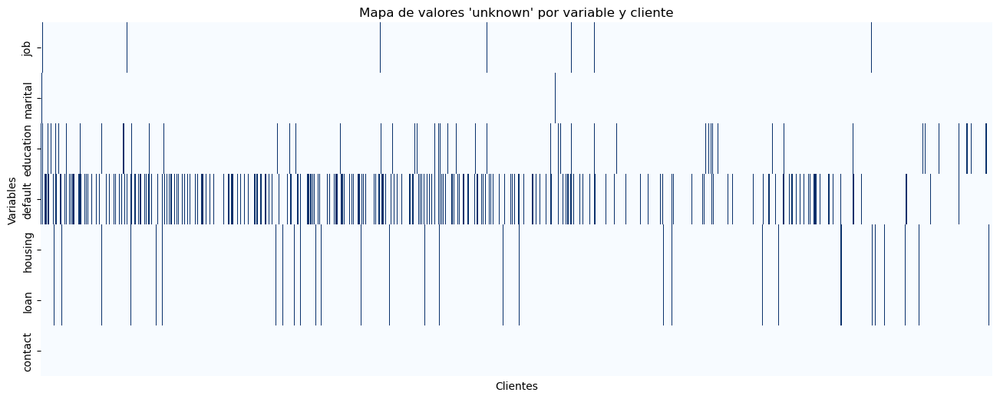

In [16]:
# Lista de columnas categóricas donde puede haber 'unknown'
cat_vars = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact']

# Creamos un DataFrame con la proporción de "unknown" por columna
unknown_map = pd.DataFrame({col: (df[col] == 'unknown').astype(int) for col in cat_vars})

plt.figure(figsize=(16, 6))
sns.heatmap(unknown_map.T, cbar=False, cmap="Blues", xticklabels=False)
plt.title("Mapa de valores 'unknown' por variable y cliente")
plt.xlabel("Clientes")
plt.ylabel("Variables")
plt.show()

Analisis de outliers:

In [17]:
# Ejemplo de uso:
variables_a_analizar = ['age', 'duration', 'campaign', 'pdays', 'previous',
                        'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
                        'euribor3m', 'nr.employed']

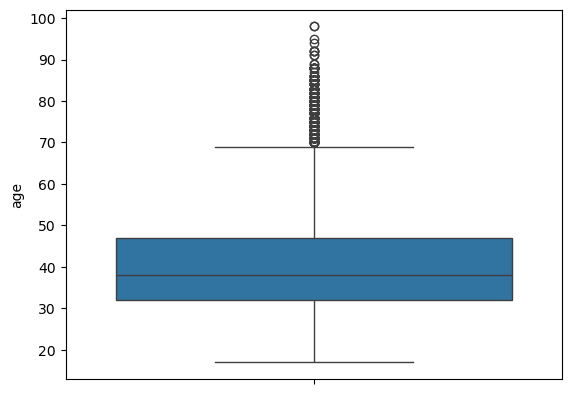

Variable: age
Valor del segundo cuartil (25%): 32.00
Valor del tercer cuartil (75%): 47.00
Valor del rango intercuartil (IQR): 15.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: 9.50
	 - Límite superior: 69.50
Hay 468 outliers en la variable 'age'
--------------------------------------------------------------------------------


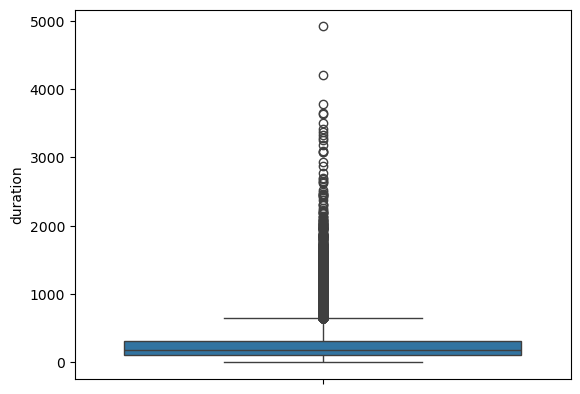

Variable: duration
Valor del segundo cuartil (25%): 102.00
Valor del tercer cuartil (75%): 319.00
Valor del rango intercuartil (IQR): 217.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: -223.50
	 - Límite superior: 644.50
Hay 2963 outliers en la variable 'duration'
--------------------------------------------------------------------------------


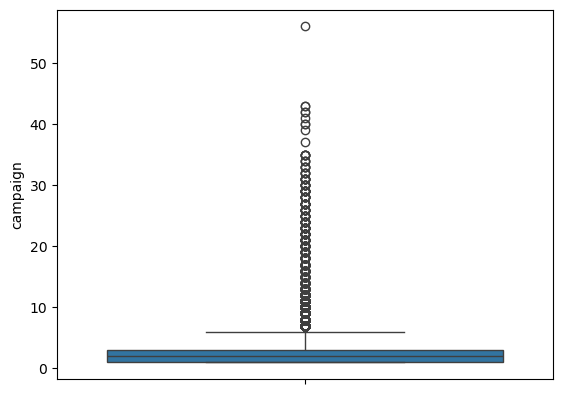

Variable: campaign
Valor del segundo cuartil (25%): 1.00
Valor del tercer cuartil (75%): 3.00
Valor del rango intercuartil (IQR): 2.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: -2.00
	 - Límite superior: 6.00
Hay 2406 outliers en la variable 'campaign'
--------------------------------------------------------------------------------


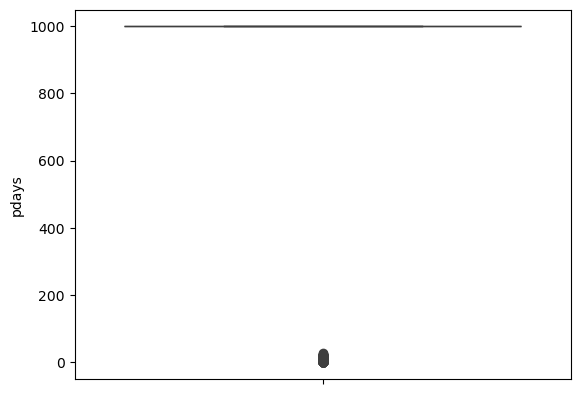

Variable: pdays
Valor del segundo cuartil (25%): 999.00
Valor del tercer cuartil (75%): 999.00
Valor del rango intercuartil (IQR): 0.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: 999.00
	 - Límite superior: 999.00
Hay 1515 outliers en la variable 'pdays'
--------------------------------------------------------------------------------


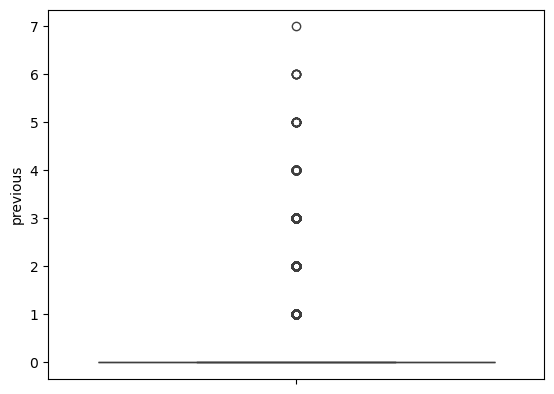

Variable: previous
Valor del segundo cuartil (25%): 0.00
Valor del tercer cuartil (75%): 0.00
Valor del rango intercuartil (IQR): 0.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: 0.00
	 - Límite superior: 0.00
Hay 5625 outliers en la variable 'previous'
--------------------------------------------------------------------------------


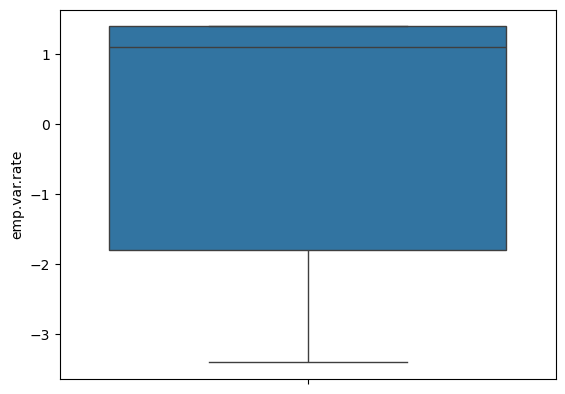

Variable: emp.var.rate
Valor del segundo cuartil (25%): -1.80
Valor del tercer cuartil (75%): 1.40
Valor del rango intercuartil (IQR): 3.20
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: -6.60
	 - Límite superior: 6.20
Hay 0 outliers en la variable 'emp.var.rate'
--------------------------------------------------------------------------------


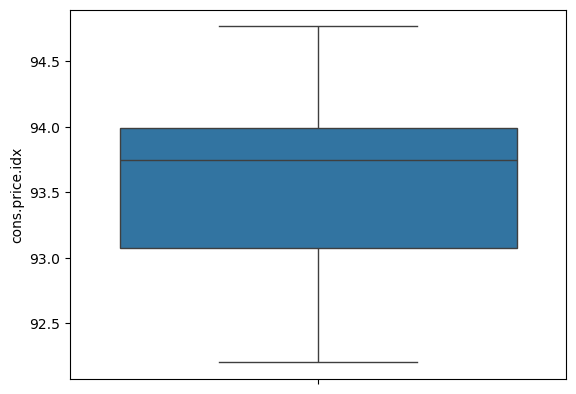

Variable: cons.price.idx
Valor del segundo cuartil (25%): 93.08
Valor del tercer cuartil (75%): 93.99
Valor del rango intercuartil (IQR): 0.92
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: 91.70
	 - Límite superior: 95.37
Hay 0 outliers en la variable 'cons.price.idx'
--------------------------------------------------------------------------------


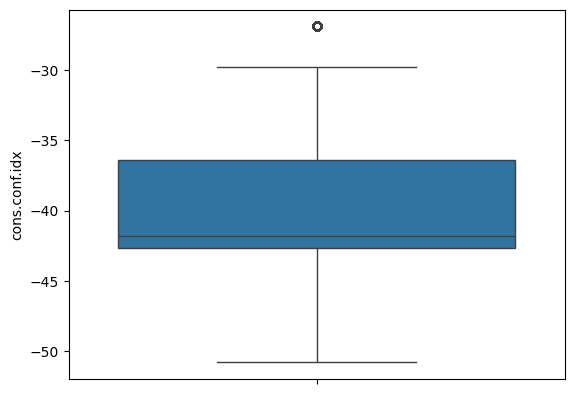

Variable: cons.conf.idx
Valor del segundo cuartil (25%): -42.70
Valor del tercer cuartil (75%): -36.40
Valor del rango intercuartil (IQR): 6.30
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: -52.15
	 - Límite superior: -26.95
Hay 446 outliers en la variable 'cons.conf.idx'
--------------------------------------------------------------------------------


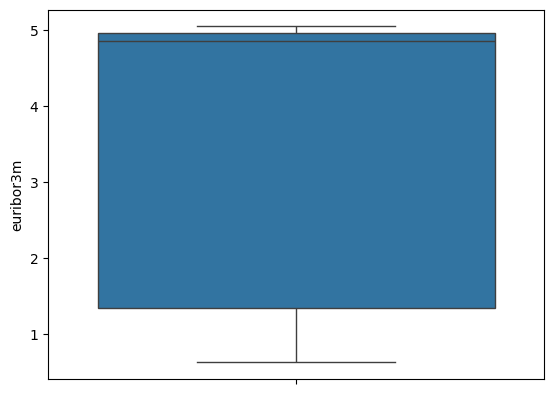

Variable: euribor3m
Valor del segundo cuartil (25%): 1.34
Valor del tercer cuartil (75%): 4.96
Valor del rango intercuartil (IQR): 3.62
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: -4.08
	 - Límite superior: 10.39
Hay 0 outliers en la variable 'euribor3m'
--------------------------------------------------------------------------------


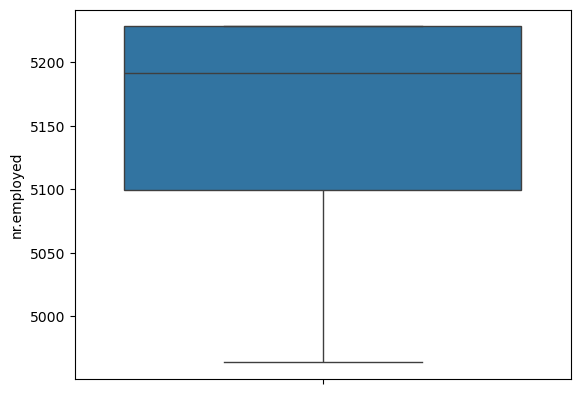

Variable: nr.employed
Valor del segundo cuartil (25%): 5099.10
Valor del tercer cuartil (75%): 5228.10
Valor del rango intercuartil (IQR): 129.00
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior: 4905.60
	 - Límite superior: 5421.60
Hay 0 outliers en la variable 'nr.employed'
--------------------------------------------------------------------------------


In [18]:
dict_outliers=deteccion_outliers_varias(df, variables_a_analizar)

Los valores atípicos reflejan comportamientos reales de clientes (variables de marketing) o condiciones macroeconómicas de contexto (variables económicas). Por ello, no las eliminaremos ni imputaremos arbitrariamente. En el caso de "pdays", corregiremos aquellos que representan errores de codificación, como el valor "999", pasandolos a NaN. En el caso de "age", vemos que los outliers no son casos irreales (min: 17, max:98), no son numerosos ya que representan solo el 1.8% de los datos y por ultimo en sexctor financiero (Banca), los clientes muy jóvenes y muy mayores pueden tener comportamientos especiales o ser targets importantes para productos concretos, por lo cual tampoco imputaremos los datos extremos (<23 y >71). Igual se hizo un analisis de impacto de aplicar transformaciones a esos outliers en el modelo de predicción mediante el corte (Winsorizar) al percentil 1 y 99, sin embargo, el resultado no cambia el recall o la precisión.

"Pdays": reemplazo de "999" por "NaN

In [19]:
# 1. pdays: reemplazar 999 por NaN
df['pdays'] = df['pdays'].replace(999, np.nan)

## Criterios y decisiones sobre outliers

**Objetivo:** proteger la interpretabilidad y la coherencia económico-operativa del dataset, sin “sobre-limpiar” señales que el modelo necesita para priorizar.

**Decisiones:**
- **`age` (edad):** distribución sin asimetrías extremas. No se winsorizó ni transformó (log) porque los valores extremos son plausibles y representan segmentos reales (jóvenes y seniors). Solo se monitorea su impacto en el modelo.
- **`campaign`, `duration`, `previous`:** representan **esfuerzo operativo real** (nº contactos, duración de llamada, intentos previos). Truncarlas o imputarlas eliminaría **patrones de saturación o persistencia**; se conservan tal cual.
- **`pdays`:** el valor **999** significa "no contactado previamente". Se transformó a **NaN** y se imputó, para el modelado de predicción, por pipeline (mediana), evitando forzar una distancia artificial entre 999 y el resto.
- **Macroeconómicas (`emp.var.rate`, `cons.price.idx`, `cons.conf.idx`, `euribor3m`, `nr.employed`):** son indicadores externos; valores “extremos” reflejan **regímenes macro** reales. No se winsorizan ni transforman.
  
**Razonamiento estadístico:**  
- Evitamos **winsorizar** salvo evidencia de asimetrías severas y no informativas para negocio.  
- Evitamos **transformaciones logarítmicas** cuando alteran la relación natural entre la variable y la probabilidad de conversión.  
- Preferimos **robustez + trazabilidad** a “over-cleaning”. El control se realiza vía **pipeline con imputación** y **validación OOF** (sin fuga de información).


# Exploracion de datos

## Análisis univariable para conocer la distribución de los datos

In [20]:
graficar_barras_porcentaje_px(df, "default")

,default,Volumen,Porcentaje
0,no,32577,79.12
1,unknown,8596,20.88
2,yes,3,0.01


Porcentaje alto de "unknown" dentro de la columna "default", por lo cual la usaremos como una variable adicional.

'''
Queremos tener el dato de cuanto unknowns existen en personas que hayan contratado un deposito a plazos para ver si existe un alto riesgo de impago.

In [21]:
'''
# Filtrar clientes que suscribieron el depósito
df_yes = df[df['y'] == 'yes']

# Total de suscriptores
total_yes = df_yes.shape[0]

# Filtrar los que tienen default = "unknown"
unknown_default = df_yes[df_yes['default'] == 'unknown'].shape[0]

# Porcentaje
porcentaje = (unknown_default / total_yes) * 100

# Mostrar resultados
print(f"Total de clientes que contrataron el depósito (y = yes): {total_yes}")
print(f"De ellos, tienen 'default' como 'unknown': {unknown_default}")
print(f"Eso representa un {porcentaje:.2f}% del total de suscriptores.")

'''

'\n# Filtrar clientes que suscribieron el depósito\ndf_yes = df[df[\'y\'] == \'yes\']\n\n# Total de suscriptores\ntotal_yes = df_yes.shape[0]\n\n# Filtrar los que tienen default = "unknown"\nunknown_default = df_yes[df_yes[\'default\'] == \'unknown\'].shape[0]\n\n# Porcentaje\nporcentaje = (unknown_default / total_yes) * 100\n\n# Mostrar resultados\nprint(f"Total de clientes que contrataron el depósito (y = yes): {total_yes}")\nprint(f"De ellos, tienen \'default\' como \'unknown\': {unknown_default}")\nprint(f"Eso representa un {porcentaje:.2f}% del total de suscriptores.")\n\n'

el 10% de los suscriptores a depositos de plazo, no sabemos si son morosos o no en el sistema crediticio, lo cual conlleva a un riesgo de impago alto.

Análisis univariable en columna "loan"

In [22]:
graficar_barras_porcentaje_px(df, "loan")

,loan,Volumen,Porcentaje
0,no,33938,82.42
1,yes,6248,15.17
2,unknown,990,2.40


2.4% de "unknown" en la columna "loan". La usaremos como una variable adicional.

In [23]:
graficar_barras_porcentaje_px(df, "housing")

,housing,Volumen,Porcentaje
0,yes,21571,52.39
1,no,18615,45.21
2,unknown,990,2.40


2.4% de "unknown" en la columna "housing". La usaremos como una variable adicional.

In [24]:
graficar_barras_porcentaje_px(df, "y")

,y,Volumen,Porcentaje
0,0,36537,88.73
1,1,4639,11.27


Agrupemos por edad para analizar la columna "age"

In [25]:
# Crear grupos de edad
bins = [0, 25, 35, 45, 55, 65, 100]
labels = ['<25', '25-35', '35-45', '45-55', '55-65', '65+'] #intervalos
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

In [26]:
graficar_barras_porcentaje_px(df, "age_group")

,age_group,Volumen,Porcentaje
0,25-35,13684,33.23
1,35-45,13495,32.77
2,45-55,8702,21.13
3,55-65,3566,8.66
4,<25,1067,2.59
5,65+,662,1.61


se han agrupado las edades segúnel un criterio habitual en estudios de mercado o bancas y seguro porque reflejan diferentes momentos de vida y ciclos de vida financieros. sus nombres serán: jóvenes <25, early career 25–35, familias jóvenes 35–45, madurez laboral 45–55, pre-jubilación 55–65, jubilados 65+

<25: estudiantes y primeros trabajadores → baja capacidad de ahorro, alta propensión digital.

25–35: inicio de carrera, primeras hipotecas, ahorro incipiente.

35–45: consolidación laboral, gastos familiares, capacidad de ahorro creciente.

45–55: peak de ingresos, buscan rentabilidad y estabilidad.

55–65: pre-jubilación, planificación de retiro, alta predisposición a depósitos a plazo.

65+: jubilados, foco en seguridad y liquidez.

Estos segmentos aseguran tanto robustez estadística como utilidad práctica para la fuerza comercial

In [27]:
graficar_barras_porcentaje_px(df, "job")

,job,Volumen,Porcentaje
0,admin.,10419,25.30
1,blue-collar,9253,22.47
2,technician,6739,16.37
3,services,3967,9.63
4,management,2924,7.10
5,retired,1718,4.17
6,entrepreneur,1456,3.54
7,self-employed,1421,3.45
8,housemaid,1060,2.57
9,unemployed,1014,2.46


In [28]:
graficar_barras_porcentaje_px(df, "marital")

,marital,Volumen,Porcentaje
0,married,24921,60.52
1,single,11564,28.08
2,divorced,4611,11.20
3,unknown,80,0.19


In [29]:
graficar_barras_porcentaje_px(df, "education")

,education,Volumen,Porcentaje
0,university.degree,12164,29.54
1,high.school,9512,23.10
2,basic.9y,6045,14.68
3,professional.course,5240,12.73
4,basic.4y,4176,10.14
5,basic.6y,2291,5.56
6,unknown,1730,4.20
7,illiterate,18,0.04


In [30]:
graficar_barras_porcentaje_px(df, "contact")

,contact,Volumen,Porcentaje
0,cellular,26135,63.47
1,telephone,15041,36.53


In [31]:
graficar_barras_porcentaje_px(df, "month")

,month,Volumen,Porcentaje
0,may,13767,33.43
1,jul,7169,17.41
2,aug,6176,15.00
3,jun,5318,12.92
4,nov,4100,9.96
5,apr,2631,6.39
6,oct,717,1.74
7,sep,570,1.38
8,mar,546,1.33
9,dec,182,0.44


In [32]:
graficar_barras_porcentaje_px(df, "day_of_week")

,day_of_week,Volumen,Porcentaje
0,thu,8618,20.93
1,mon,8512,20.67
2,wed,8134,19.75
3,tue,8086,19.64
4,fri,7826,19.01


In [33]:
graficar_barras_porcentaje_px(df, "campaign")

,campaign,Volumen,Porcentaje
0,1,17634,42.83
1,2,10568,25.67
2,3,5340,12.97
3,4,2650,6.44
4,5,1599,3.88
5,6,979,2.38
6,7,629,1.53
7,8,400,0.97
8,9,283,0.69
9,10,225,0.55


Más del 80% de la base están entre 1 y 3 llamadas durante esra campaña para este cliente.

In [34]:
graficar_barras_porcentaje_px(df, "previous")

,previous,Volumen,Porcentaje
0,0,35551,86.34
1,1,4561,11.08
2,2,754,1.83
3,3,216,0.52
4,4,70,0.17
5,5,18,0.04
6,6,5,0.01
7,7,1,0.00


De esta base de datos, solo el 13.6% fue contactado fuera de esta campaña (no necesariamente para una campaña anterior), de la cual el 11.1% fueron tocados con una sola llamada.

In [35]:
graficar_barras_porcentaje_px(df, "pdays")

,pdays,Volumen,Porcentaje
0,3.0,439,28.98
1,6.0,412,27.19
2,4.0,118,7.79
3,9.0,64,4.22
4,2.0,61,4.03
5,7.0,60,3.96
6,12.0,58,3.83
7,10.0,52,3.43
8,5.0,46,3.04
9,13.0,36,2.38


el 96% tiene 999 días, quiere decir que no se han contactado al 86% de la base y el 10% de diferencia puede ser que no existe el dato. Hay un 2% que fue contactado a hace 2 o 1 día. Número extremadamente pequeño.

In [36]:
graficar_barras_porcentaje_px(df, "poutcome")

,poutcome,Volumen,Porcentaje
0,nonexistent,35551,86.34
1,failure,4252,10.33
2,success,1373,3.33


De nuestra base de datos, solo el 13.6% fue contactado en una campaña anterior, de los cuales el 24.3% accedio a comprar la campaña anterior.

## Análisis bivariable númericas

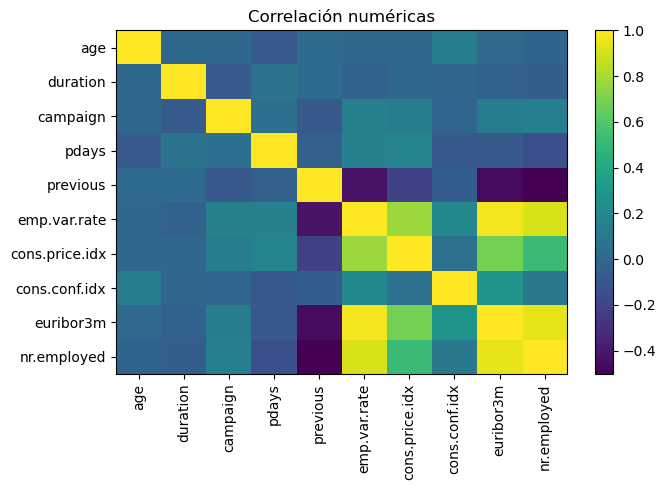

In [37]:
# Matriz de correlación de numéricas
num_cols = ['age','duration','campaign','pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']
corr = df[num_cols].corr()
plt.figure(figsize=(7,5))
plt.imshow(corr, aspect='auto'); plt.colorbar(); plt.title("Correlación numéricas"); plt.xticks(range(len(num_cols)), num_cols, rotation=90); plt.yticks(range(len(num_cols)), num_cols)
plt.tight_layout(); plt.show()

## Análisis bivariable para conocer la relación con la variable objetivo **y**

### Variables categoricas demograficas

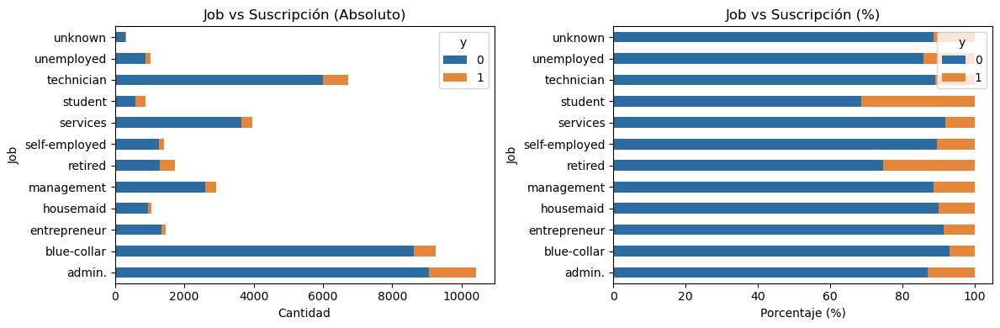

In [38]:
var = 'job'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

JOB: Los grupos de mayor tamaño son administrativos y obreros (administracion es la tercera mejor conversión). Sin embargo, los grupos más pequeños  convierten mejor: “student”, “retired” y “unemployed”.

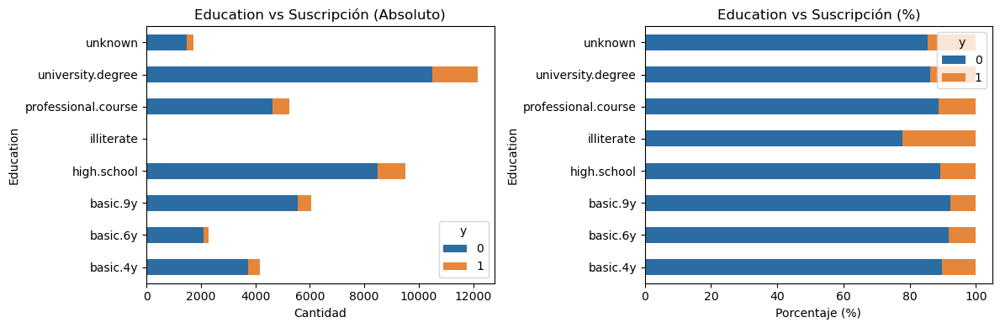

In [39]:
var = 'education'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

EDUCATION: Personas con estudios universitarios son los que tienen mayor volumen y 2da mejor conversión!  Analfabetos (grupo extremadamente pequeño) tienen mejor tasa.

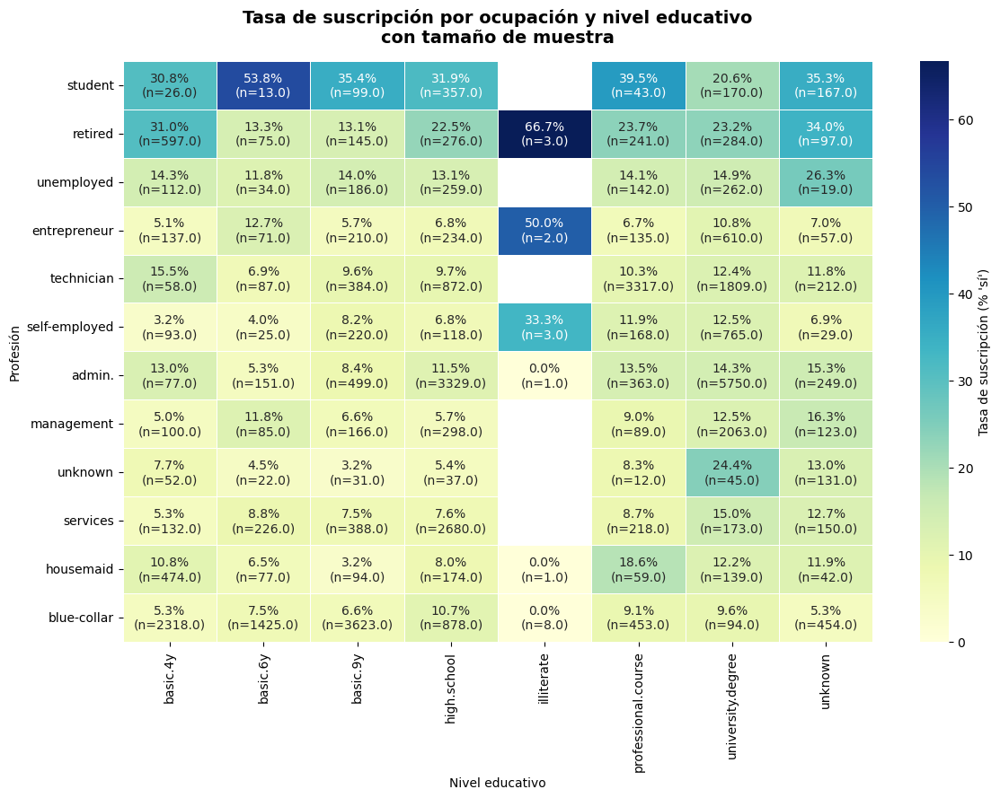

In [40]:
# --- Tasa de suscripción por ocupación y educación con tamaño de muestra ---

# 1) Asegurar target binario
df['y_num'] = (
    df['y'].astype(str).str.strip().str.lower()
      .map({'1':1,'0':0,'yes':1,'no':0,'true':1,'false':0})
      .astype(int)
)

# 2) Pivot con MEAN (tasa) y COUNT (n)
pv_mean = df.pivot_table(index='job', columns='education', values='y_num', aggfunc='mean')
pv_cnt  = df.pivot_table(index='job', columns='education', values='y_num', aggfunc='count')

# 3) Formateo de anotaciones: "xx.x%\n(n=yyyy)"
tasa_pct = (pv_mean * 100).round(1)
annot_table = tasa_pct.astype(str) + '%\n(n=' + pv_cnt.astype(str) + ')'

# 4) Ordenar filas por tasa promedio global
orden = pv_mean.mean(axis=1).sort_values(ascending=False).index
tasa_pct = tasa_pct.loc[orden]
annot_table = annot_table.loc[orden]

# 5) Heatmap
plt.figure(figsize=(12, 9))
ax = sns.heatmap(
    tasa_pct, annot=annot_table, fmt="",
    cmap='YlGnBu', cbar_kws={"label": "Tasa de suscripción (% 'sí')"},
    linewidths=0.5
)
plt.title("Tasa de suscripción por ocupación y nivel educativo\ncon tamaño de muestra",
          fontsize=14, pad=15, fontweight='bold')
plt.ylabel("Profesión")
plt.xlabel("Nivel educativo")
plt.tight_layout()
plt.show()


Este gráfico nos dice que tanto estudiantes como retirados tienen alta suscripción indiferentemente del nivel educativo, pero que los analfabeltos tambien tienen un fuerte relación en profesiones como "entrepeneur" y "empleado-propio". Además los estudiantes no solo significan ser jovenes relacionada a educación básica, sino también personas que realizan cursos profesionales.

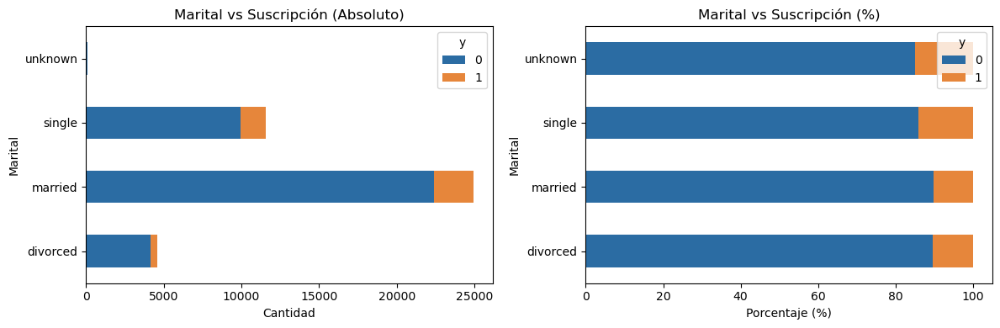

In [41]:
var = 'marital'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

MARITAL: Solteros y divorciados convierten algo más que casados sin que ser una diferencia relevante.

### Variables categoricas financieras

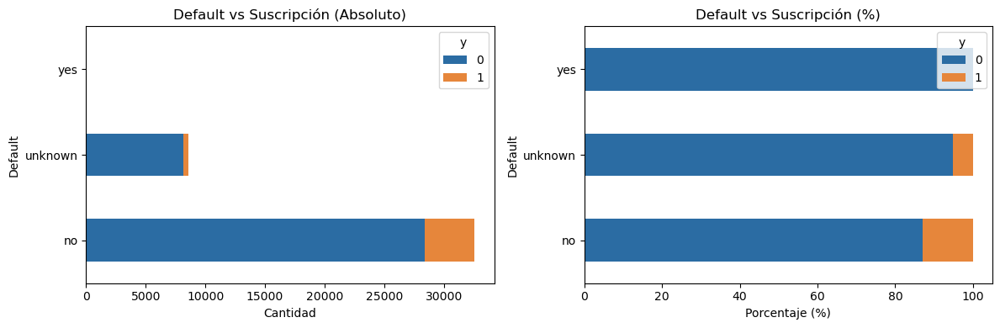

In [42]:
var = 'default'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

DEFAULT: Clientes con mora prácticamente no convierten. Unknown es un misterio ya que tiene una conversión aceptable.

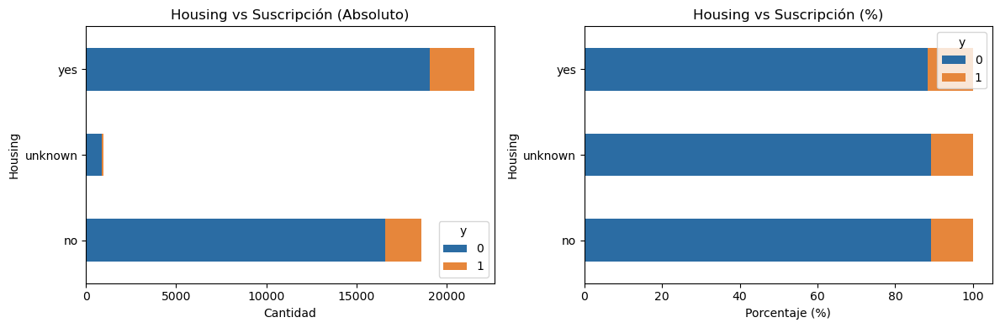

In [43]:
var = 'housing'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

HOUSING: Muy Leve mayor conversión en quienes no tienen hipoteca. No importa tanto si tiene o no hipoteca.

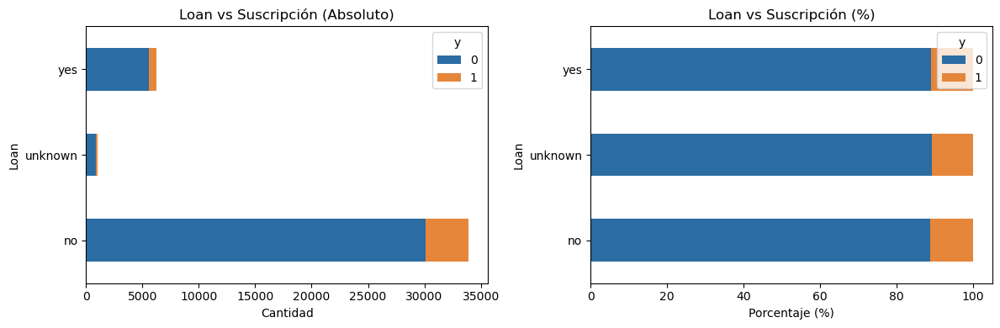

In [44]:
var = 'loan'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

LOAN: Leve mayor conversión en quienes no tienen prestamos personal. Sin embargo no importa tanto si tiene o no credito personal.

### Variables categoricas de campaña

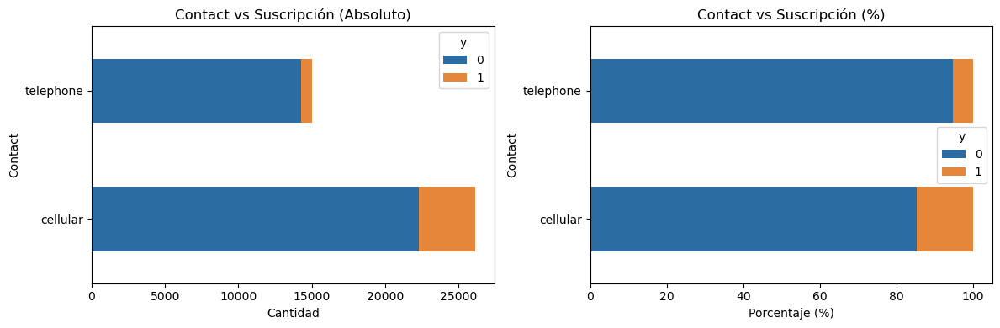

In [45]:
var = 'contact'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

CONTACT: Contacto por celular es mucho más efectivo que por teléfono fijo.

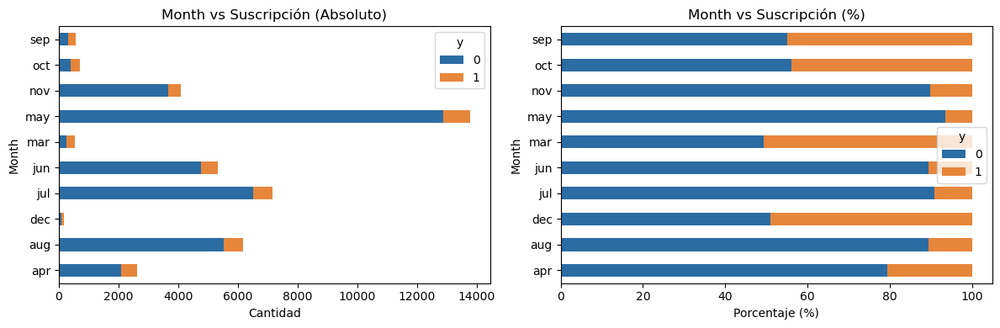

In [46]:
var = 'month'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

MONTH: las mejores conversiones se dan en meses que no hay volumen de datos. EL volumen de llamadas se da entre Mayo a Agosto.

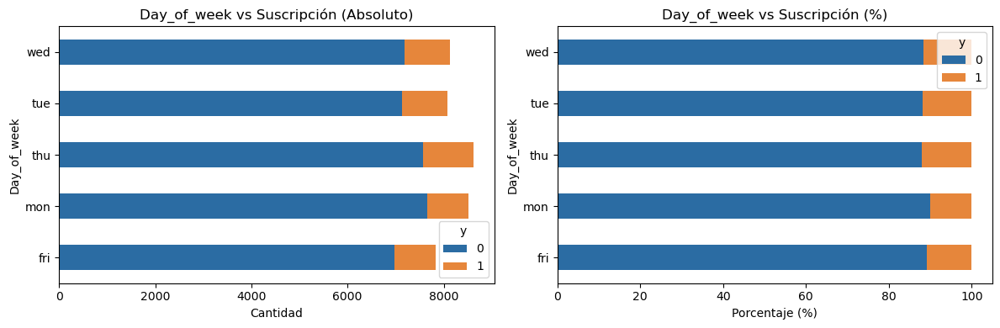

In [47]:
var = 'day_of_week'  # Cambia aquí para analizar otra variable

# Tabla absoluta y porcentaje
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define colores personalizados (azul y naranja)
colores = ['#2B6CA3', '#E6863B']  # azul, naranja (puedes cambiar los hex si prefieres otros tonos)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

DAY_OF_WEEK: Intracendente

POUTCOME: Si campaña anterior fue “success”, hay muchísima más conversión, sin embargo es una base muy pequeña.

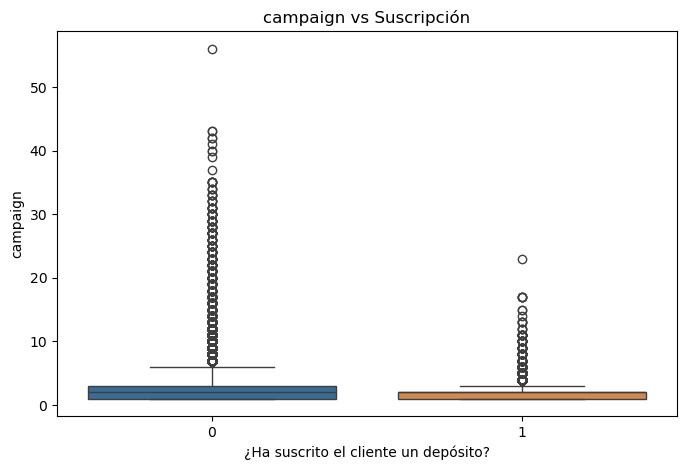

In [48]:
# Cambia aquí la variable que quieres analizar
var = 'campaign'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

CAMPAIGN: Más de 3 contactos reducen la probabilidad de conversión.

### Variables númericas demográficas

Cuartiles de edad:
0.25    32.0
0.50    38.0
0.75    47.0
Name: age, dtype: float64


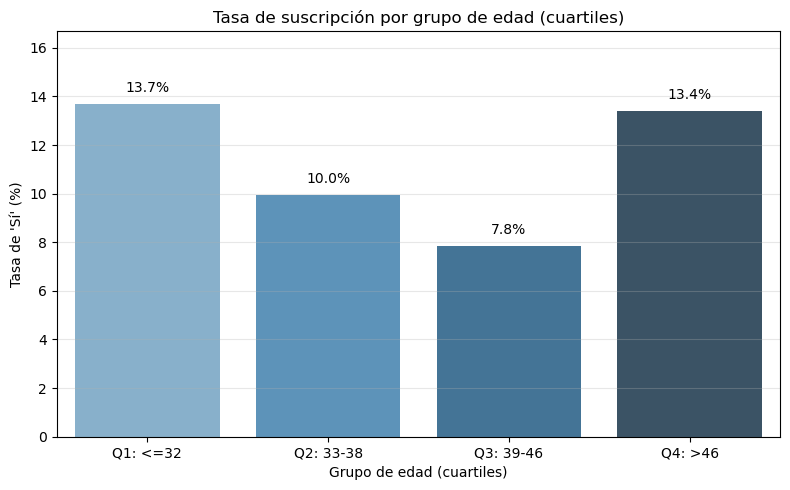

In [49]:
# Ver cuartiles reales de 'age'
age_quartiles = df['age'].quantile([0.25, 0.5, 0.75])
print("Cuartiles de edad:")
print(age_quartiles)
# Definir los cortes con los cuartiles
cuts = [-float('inf'), age_quartiles[0.25], age_quartiles[0.5], age_quartiles[0.75], float('inf')]
labels = ['Q1: <=32', 'Q2: 33-38', 'Q3: 39-46', 'Q4: >46']
# Crear columna categórica
df['age_group'] = pd.cut(df['age'], bins=cuts, labels=labels, include_lowest=True)
# Tabla cruzada: grupo de edad vs y
age_y_crosstab = pd.crosstab(df['age_group'], df['y'], normalize='index') * 100
# También queremos el tamaño de cada grupo
group_size = df['age_group'].value_counts().sort_index()
# Opción alternativa limpia
tasa_si = df.groupby('age_group')['y'].mean() * 100  # en porcentaje
# Convertir a DataFrame
age_y_crosstab = tasa_si.reset_index().rename(columns={'y': 'tasa_si'})
# Gráfico
plt.figure(figsize=(8, 5))
sns.barplot(data=age_y_crosstab, x='age_group', y='tasa_si', palette='Blues_d')
for i, rate in enumerate(age_y_crosstab['tasa_si']):
    plt.text(i, rate + 0.5, f"{rate:.1f}%", ha='center', fontsize=10)
plt.title("Tasa de suscripción por grupo de edad (cuartiles)")
plt.ylabel("Tasa de 'Sí' (%)")
plt.xlabel("Grupo de edad (cuartiles)")
plt.ylim(0, tasa_si.max() + 3)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

In [50]:
print(df['age_group'].value_counts().sort_index())

age_group
Q1: <=32     11173
Q2: 33-38     9997
Q3: 39-46    10135
Q4: >46       9871
Name: count, dtype: int64


POdemos ver que el Q1 y el Q4 (las colas) tienen la mejor conversión. Busquemos grupos de edad que tengan profesiones relacionadas con estos quartiles.

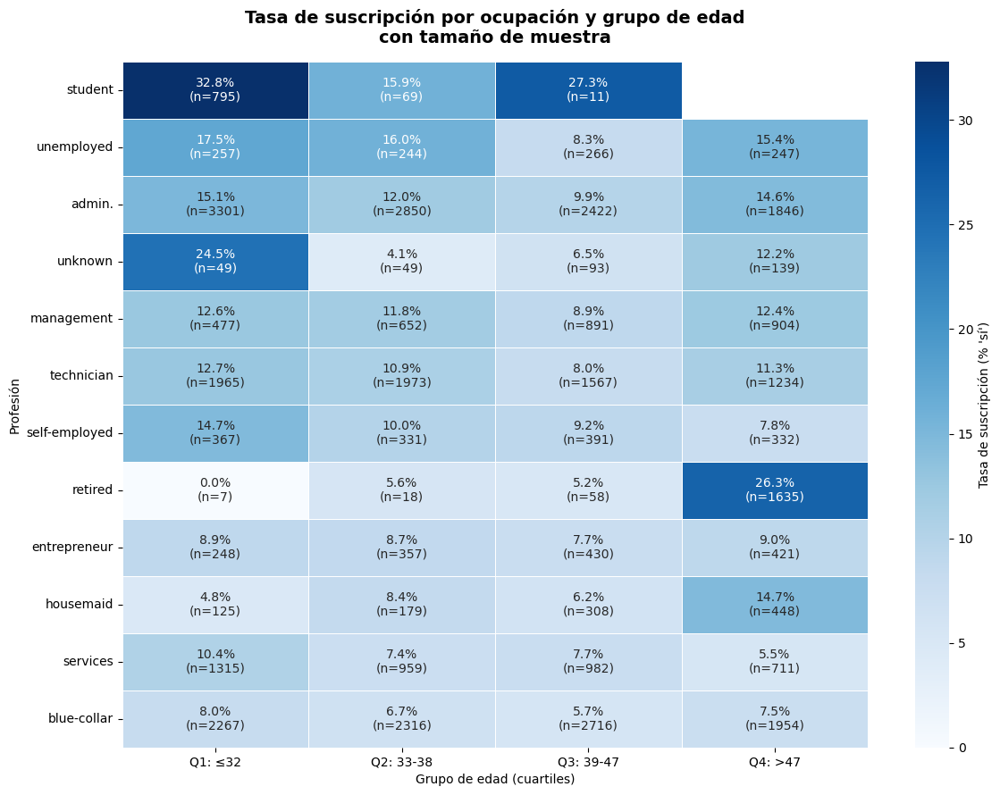

In [51]:
df = df.copy()

# 1) y_num robusto (0/1)
df['y_num'] = (
    df['y'].astype(str).str.strip().str.lower()
      .map({'1':1,'0':0,'yes':1,'no':0,'true':1,'false':0})
      .astype(int)
)

# 2) age_group por cuartiles (usa tus labels)
q = df['age'].quantile([0.25, 0.5, 0.75])
cuts = [-np.inf, q.iloc[0], q.iloc[1], q.iloc[2], np.inf]
labels = [f"Q1: ≤{int(q.iloc[0])}",
          f"Q2: {int(q.iloc[0])+1}-{int(q.iloc[1])}",
          f"Q3: {int(q.iloc[1])+1}-{int(q.iloc[2])}",
          f"Q4: >{int(q.iloc[2])}"]
df['age_group'] = pd.cut(df['age'], bins=cuts, labels=labels, include_lowest=True)

# 3) Pivot con MEAN (tasa) y COUNT (n)
pv_mean = df.pivot_table(index='job', columns='age_group', values='y_num', aggfunc='mean')
pv_cnt  = df.pivot_table(index='job', columns='age_group', values='y_num', aggfunc='count')

# 4) Formateo de anotaciones: "xx.x%\n(n=yyyy)"
tasa_pct = (pv_mean * 100).round(1)
annot_table = tasa_pct.astype(str) + '%\n(n=' + pv_cnt.astype(str) + ')'

# 5) Ordenar filas por tasa promedio global
orden = pv_mean.mean(axis=1).sort_values(ascending=False).index
tasa_pct = tasa_pct.loc[orden]
annot_table = annot_table.loc[orden]

# 6) Heatmap
plt.figure(figsize=(12, 9))
ax = sns.heatmap(
    tasa_pct, annot=annot_table, fmt="",
    cmap='Blues', cbar_kws={"label": "Tasa de suscripción (% 'sí')"},
    linewidths=0.5
)
plt.title("Tasa de suscripción por ocupación y grupo de edad\ncon tamaño de muestra",
          fontsize=14, pad=15, fontweight='bold')
plt.ylabel("Profesión")
plt.xlabel("Grupo de edad (cuartiles)")
plt.tight_layout()
plt.show()

Definimos los age groups en <25, 25–35, 35–45, 45–55, 55–65 y 65+, ya que estos cortes son estándar en estudios bancarios y corresponden a diferentes etapas de vida financiera de los clientes.

**<25: jovenes** → estudiantes y primeros trabajadores, baja capacidad de ahorro, alta propensión digital.

**25–35:early career** → inicio de carrera, primeras hipotecas, ahorro incipiente.

**35–45: familias jovenes** → consolidación laboral, gastos familiares, capacidad de ahorro creciente.

**45–55: madurez laboral** → peak de ingresos, buscan rentabilidad y estabilidad.

**55–65: pre-jubilación** → planificación de retiro, alta predisposición a depósitos a plazo.

**65+: jubilados** → foco en seguridad y liquidez.
Estos segmentos aseguran tanto robustez estadística como utilidad práctica para la fuerza comercial.

In [52]:
# Crear grupos de edad: Estudiantes, Jovenes adultos, Adultos 1, adultos 2, adultos superiores, retirados
bins = [0, 25, 35, 45, 55, 65, 100]
labels = ['<25', '25-35', '35-45', '45-55', '55-65', '65+'] #intervalos
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

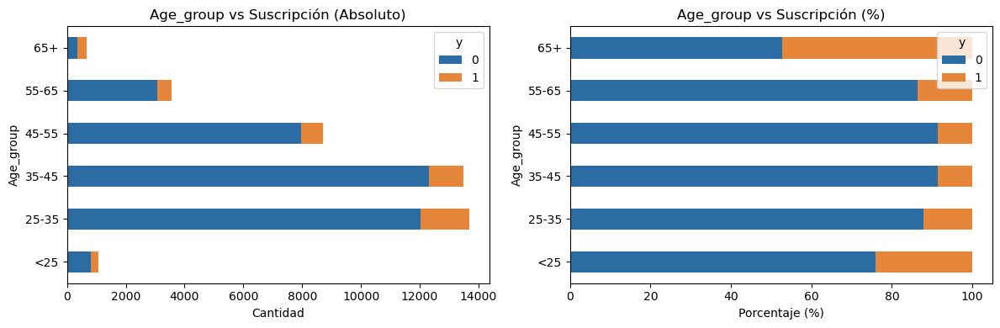

In [53]:
var = 'age_group'  # Cambia a cualquier columna categórica

# Calcula tablas absolutas y porcentajes
tabla_abs = df.groupby([var, 'y']).size().unstack(fill_value=0)
tabla_pct = tabla_abs.div(tabla_abs.sum(axis=1), axis=0) * 100

# Define tus colores personalizados: azul y naranja
colores = ['#2B6CA3', '#E6863B']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Gráfico absoluto
tabla_abs.plot(kind='barh', stacked=True, color=colores, ax=axes[0])
axes[0].set_title(f"{var.capitalize()} vs Suscripción (Absoluto)")
axes[0].set_xlabel("Cantidad")
axes[0].set_ylabel(var.capitalize())

# Gráfico porcentaje
tabla_pct.plot(kind='barh', stacked=True, color=colores, ax=axes[1])
axes[1].set_title(f"{var.capitalize()} vs Suscripción (%)")
axes[1].set_xlabel("Porcentaje (%)")
axes[1].set_ylabel(var.capitalize())

plt.tight_layout()
plt.show()

In [54]:
print(df['age_group'].value_counts().sort_index())

age_group
<25       1067
25-35    13684
35-45    13495
45-55     8702
55-65     3566
65+        662
Name: count, dtype: int64


AGE: Segmento <25 y >65 tienen excelentes conversiones pero el tamaño del segmento es bastante reducido. El segmento 25-35 es interesante ya que es el de mayor tamaño y su conversión es mayor a los otros >25 y <65

Podemor ver que cuando cruzamos edad vs profesión, vemos que la mediana del grupo de estudiantes está alrededor de 25 años y los retirados alrededor de los 60. Por ende podemos definir que estos dos grupos son los que tienen una mayor efectividad a la compra de un deposito a largo plazo.

### Variables númericas de campaña

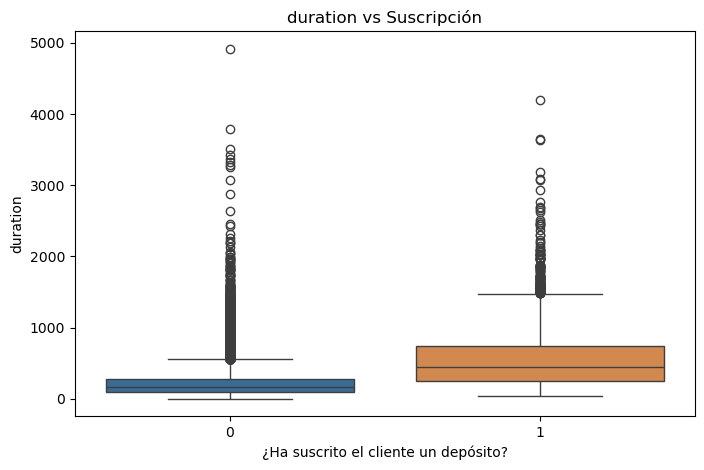

In [55]:
# Cambia aquí la variable que quieres analizar
var = 'duration'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

DURATION: Es el mejor predictor: contactos largos tienden a ser exitosos.

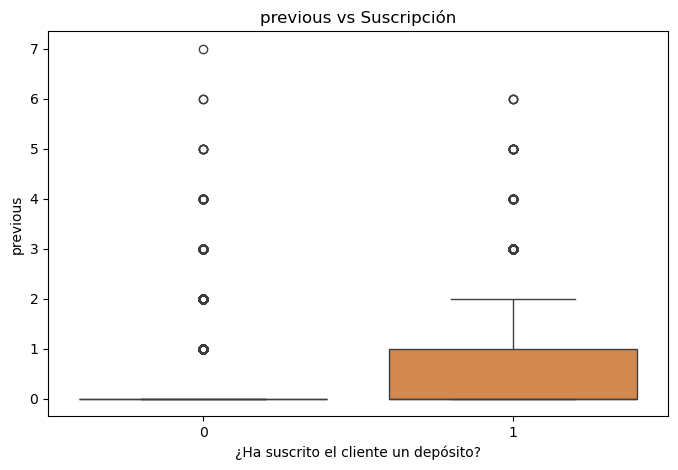

In [56]:
# Cambia aquí la variable que quieres analizar
var = 'previous'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

PREVIOUS: Más interacciones pasadas (sin que tengan que ser por campañas pasadas) se correlacionan con mayor conversión.

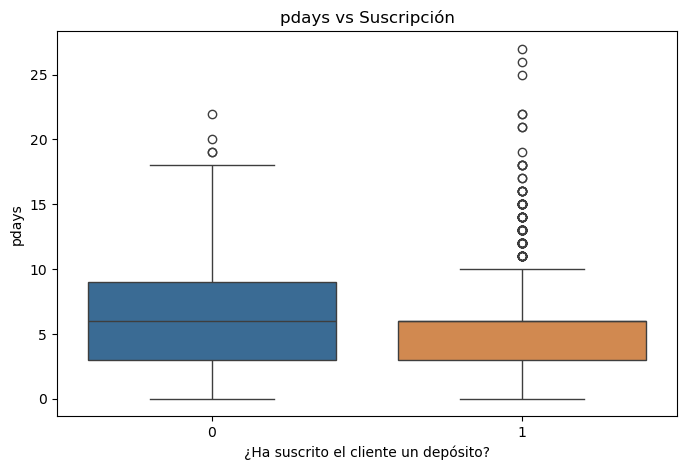

In [57]:
# Cambia aquí la variable que quieres analizar
var = 'pdays'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

pdays el 96% de la base tiene 999 días (86% no se tuvo contacto y el 10% adicional puede ser error o contactado hace muchos años). Solo el 4% de la base ha sido contactada antes de los cuales un 2% tiene contacto entre 1 y 2 días, con buenos resultados. Se recomienda eliminar en esta grafica el outlier 999 para tener una mejor visión.Conlcusión: Contactos recientes (bajo pdays) muestran más probabilidad de éxito. Sin embargo el número es muy pequeño.

### Variables númericas económicas

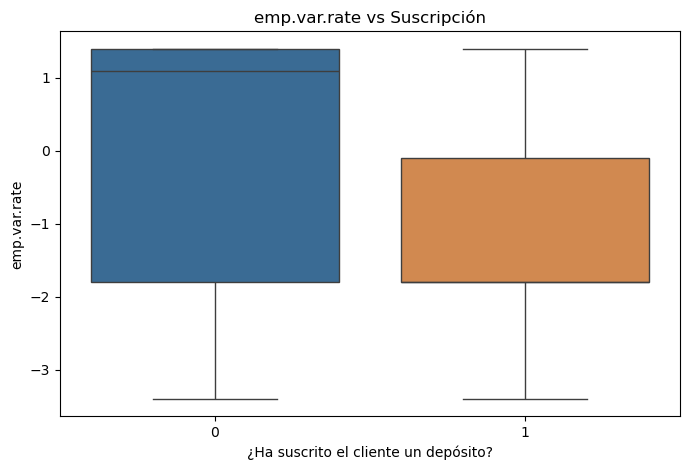

In [58]:
# Cambia aquí la variable que quieres analizar
var = 'emp.var.rate'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

EMP.VAR.RATE: Tasa negativa de empleo muestra más conversiones (probable efecto crisis).

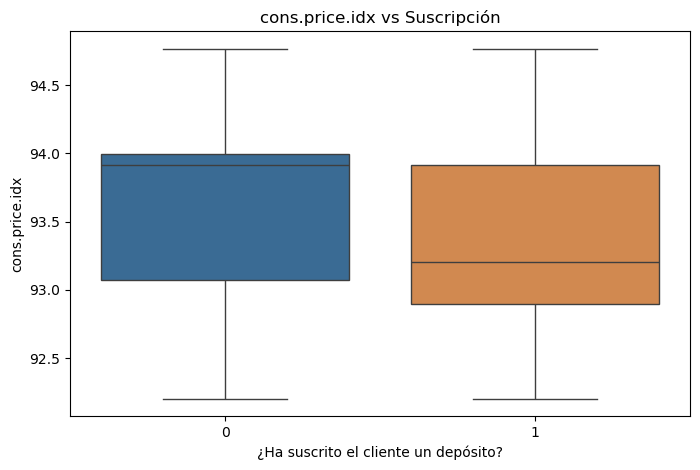

In [59]:
# Cambia aquí la variable que quieres analizar
var = 'cons.price.idx'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

CONS.PRICE.IDXC: Leve influencia: valores más bajos tienden a más conversiones.

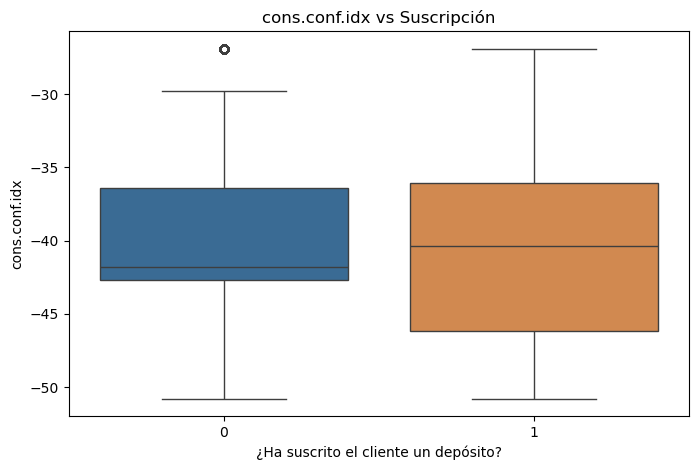

In [60]:
# Cambia aquí la variable que quieres analizar
var = 'cons.conf.idx'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

CONS.CONF.IDX: Índice negativo (baja confianza) coincide con más depósitos.

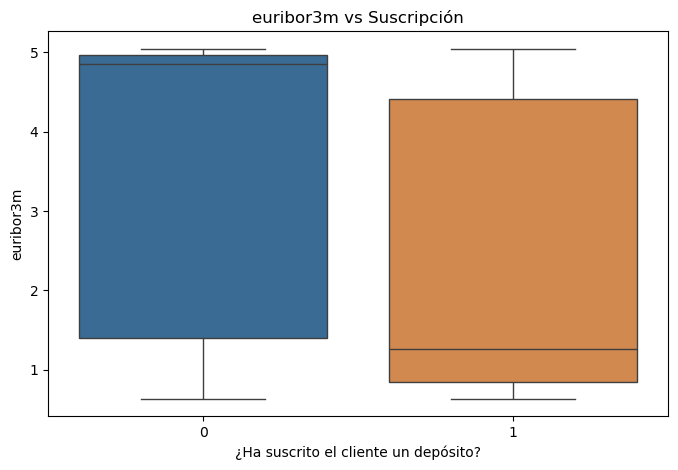

In [61]:
# Cambia aquí la variable que quieres analizar
var = 'euribor3m'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

EURIBOR3M: Valores bajos del Euribor (0.6–1.0) tienen más éxito.

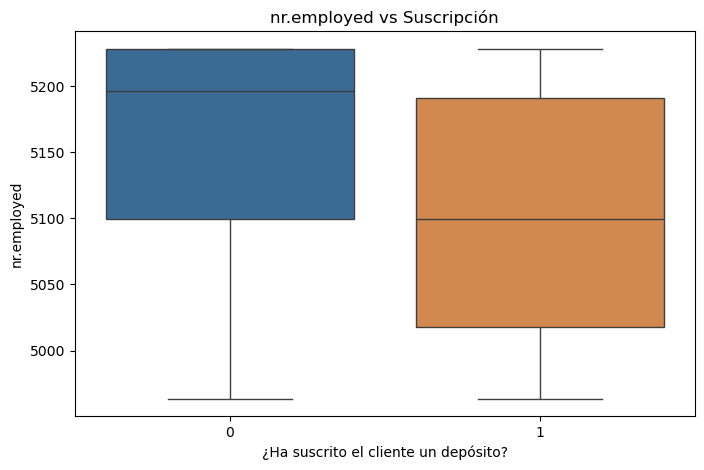

In [62]:
# Cambia aquí la variable que quieres analizar
var = 'nr.employed'  # Por ejemplo: 'campaign', 'duration', 'pdays', etc.

# Convertir y a variable binaria (si no está hecho ya)
df['y_numeric'] = df['y'].map({'no': 0, 'yes': 1})

plt.figure(figsize=(8, 5))
sns.boxplot(x='y', y=var, data=df, palette=['#2B6CA3', '#E6863B'])
plt.title(f'{var} vs Suscripción')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel(var)
plt.show()

NR.EMPLOYED: Fewer empleados (más paro) pueden coincidir con más conversión.

In [63]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_group,y_num,y_numeric
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN


## Mapa de correlaciones por clase de variables (demograficas, financieras, de campaña y economicas)

In [90]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_group,y_num,y_numeric,y_texto,score_oof,segmento_oof,decile_score,llamar_econ,contestada,coste,ingreso,roi,month_num
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN,no,0.312252,Medio,D7,1,1,30.0,0.0,-1.0,5
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN,no,0.297544,Medio,D7,1,1,30.0,0.0,-1.0,5
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN,no,0.243202,Medio,D5,1,1,30.0,0.0,-1.0,5
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN,no,0.227266,Medio,D5,1,1,30.0,0.0,-1.0,5
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN,no,0.243402,Medio,D5,1,1,30.0,0.0,-1.0,5


In [92]:
for col in df.select_dtypes(include=['bool']).columns:
    df[col] = df[col].astype(int)


dict_attrib_class={'demograficas':['age','job','marital','education','y'],
                   'financieras':['default','housing','loan','y'],
                   'campaña':['contact','month','day_of_week','duration','campaign','pdays','previous','poutcome','y'],
                   'economicas':['emp.var.rate',	'cons.price.idx',	'cons.conf.idx',	'euribor3m',	'nr.employed'	,'y']}

for k,v in dict_attrib_class.items():
  print(k.upper())

  # Convert categorical variables to numerical (using target/mean encoding)
  # Alternatively, you can use one-hot encoding, but that increases dimensions
  target = 'y'  # you can set to another column if desired
  df_encoded = df[v]

  for col in df[v].select_dtypes(include='object').columns:
      if col != target:
          df_encoded[col] = df_encoded.groupby(col)[target].transform(lambda x: x.map({'yes': 1, 'no': 0}).mean())

  # Encode target column last
  df_encoded[target] = df_encoded[target].map({'yes': 1, 'no': 0})
  
  # Now calculate correlations
  df_corr = df_encoded.corr()

  # Mask
  mask = np.zeros_like(df_corr, dtype=bool)
  mask[np.triu_indices_from(mask)] = True

  # Viz
  df_corr_viz = df_corr.mask(mask)#.dropna(how='all').dropna('columns', how='all')

  # Plot using Plotly
  fig = px.imshow(
      df_corr_viz,
      text_auto='.2f',
      color_continuous_scale='RdBu_r',
      title=f'Mapa de correlaciones de variables {k.upper()}',
      aspect='auto',
      zmin=-1,
      zmax=1
  )
  fig.show()

DEMOGRAFICAS


FINANCIERAS


CAMPAÑA


ValueError: could not convert string to float: 'may'

  ##  Análisis con pandas profiling

In [64]:
profile = ProfileReport(df, title="Bank loan Dataset Report", explorative=True)
profile.to_file("banking_loan_dataset_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:01<00:00, 22.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [66]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_group,y_num,y_numeric
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,35-45,0,NaN
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,NaN,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,55-65,0,NaN


PERFIL DE LAS PERSONAS QUE HAN SUSCRITO UN DEPOSITO A PLAZOS: Hombre o mujer de entre 35 y 50 años, Ha sido contactado una o dos veces (no más), No había sido contactado antes (pdays = 999, previous = 0), Se le dedicó un tiempo de llamada largo (>= 500 segundos), Fue contactado en meses como marzo, abril u octubre, por móvil, No tiene créditos personales o hipotecarios, Vive en un contexto económico complejo, lo que aumentó su interés por depósitos seguros.

In [67]:
# Subconjunto de suscriptores
df['y_texto'] = df['y'].map({1: 'yes', 0: 'no', True: 'yes', False: 'no'})
df_yes = df[df['y_texto'] == 'yes'].copy()

# Perfil medio
perfil_suscriptor = df_yes.describe(include='all').T
display(perfil_suscriptor)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,4639.0,NaN,NaN,NaN,40.912266,13.838838,17.0,31.0,37.0,50.0,98.0
job,4639,12,admin.,1351,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,4639,4,married,2531,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,4639,8,university.degree,1669,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,4639,2,no,4196,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,4639,3,yes,2507,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,4639,3,no,3849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,4639,2,cellular,3852,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,4639,10,may,886,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,4639,5,thu,1044,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
for var in ['job', 'education', 'marital', 'housing', 'loan']:
    print(f"\nComparativa de {var}")
    print("Sí:")
    print(df[df['y'] == 'yes'][var].value_counts(normalize=True).round(3) * 100)
    print("No:")
    print(df[df['y'] == 'no'][var].value_counts(normalize=True).round(3) * 100)


Comparativa de job
Sí:
Series([], Name: proportion, dtype: float64)
No:
Series([], Name: proportion, dtype: float64)

Comparativa de education
Sí:
Series([], Name: proportion, dtype: float64)
No:
Series([], Name: proportion, dtype: float64)

Comparativa de marital
Sí:
Series([], Name: proportion, dtype: float64)
No:
Series([], Name: proportion, dtype: float64)

Comparativa de housing
Sí:
Series([], Name: proportion, dtype: float64)
No:
Series([], Name: proportion, dtype: float64)

Comparativa de loan
Sí:
Series([], Name: proportion, dtype: float64)
No:
Series([], Name: proportion, dtype: float64)


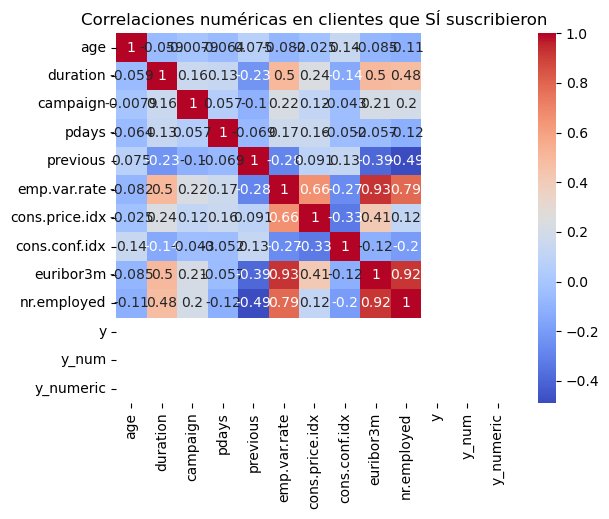

In [69]:
df_yes_num = df_yes.select_dtypes(include=['float64', 'int64'])
sns.heatmap(df_yes_num.corr(), annot=True, cmap='coolwarm')
plt.title("Correlaciones numéricas en clientes que SÍ suscribieron")
plt.show()

## Modelado (pipeline, CV, calibración)
<a id="modelado-pipeline-cv-calibración"></a>

Pipeline con Logistic Regression balanceado…

In [70]:
# Selección de variables (pre contacto)
features = [
    'age',         # edad
    'job',         # ocupación
    'marital',     # estado civil
    'education',   # nivel educativo
    'default',     # impago en crédito
    'housing',     # préstamo hipotecario
    'loan',        # préstamo personal
    'emp.var.rate',      # Tasa de variación del empleo (numérico)
    'cons.price.idx',    # Índice de precios al consumo (numérico)
    'cons.conf.idx',     # Índice de confianza del consumidor (numérico)
    'euribor3m',         # Tasa del Euribor a 3 meses (numérico)
    'nr.employed'        # Número de empleados (numérico)

]

# Transformar variables categóricas a dummies
X = pd.get_dummies(df[features], drop_first=True)
y = df['y']

# Dividir datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Modelo
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [71]:
# Predicciones de probabilidad
y_proba = model.predict_proba(X_test)[:, 1]

# Nuevo umbral
umbral = 0.5
y_pred_umbral = (y_proba >= umbral).astype(int)

Coeficientes del modelo de regresión logística:
                               Coefficient
age                               0.003797
emp.var.rate                     -0.404420
cons.price.idx                    0.452406
cons.conf.idx                     0.021327
euribor3m                         0.117094
nr.employed                      -0.008597
job_blue-collar                  -0.266406
job_entrepreneur                 -0.111590
job_housemaid                    -0.024829
job_management                   -0.122180
job_retired                       0.305560
job_self-employed                -0.082632
job_services                     -0.250158
job_student                       0.347815
job_technician                   -0.000425
job_unemployed                   -0.043742
job_unknown                       0.000993
marital_married                   0.108359
marital_single                    0.212064
marital_unknown                   0.042643
education_basic.6y                0.071689
educat

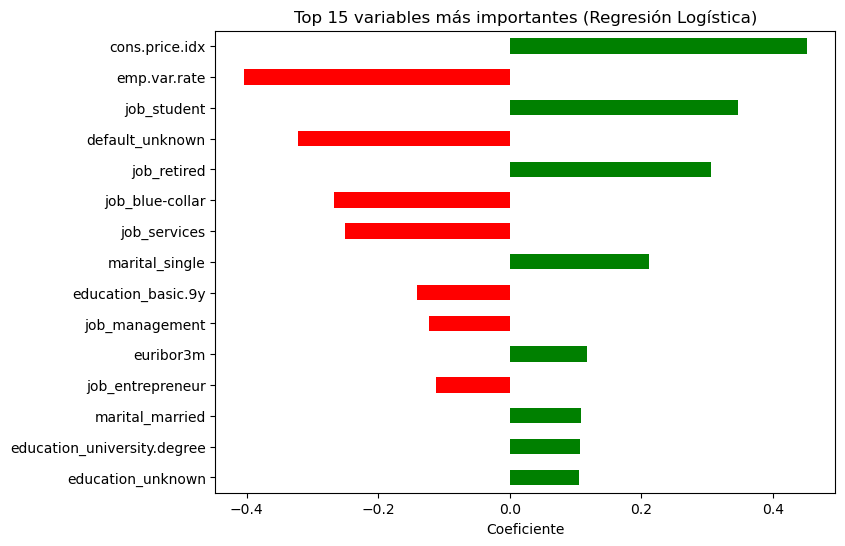

In [72]:
# Coeficientes del modelo
coefficients = pd.DataFrame(model.coef_.flatten(), index=X.columns, columns=['Coefficient'])
print("Coeficientes del modelo de regresión logística:")
print(coefficients)

intercept = model.intercept_
print(f"Intercept: {intercept}")

#Ordenar por valor absoluto del coeficiente (importancia en la predicción)
top_coef = coefficients.reindex(coefficients['Coefficient'].abs().sort_values(ascending=False).index).head(15)

# Crear gráfico de barras horizontales
plt.figure(figsize=(8, 6))
top_coef['Coefficient'].plot(kind='barh', color=['green' if c > 0 else 'red' for c in top_coef['Coefficient']])
plt.xlabel('Coeficiente')
plt.title('Top 15 variables más importantes (Regresión Logística)')
plt.gca().invert_yaxis()  # Para que la variable más importante quede arriba

Accuracy: 0.888052452646916

Reporte de clasificación:
              precision    recall  f1-score   support

 No Suscribe       0.90      0.99      0.94      7308
    Suscribe       0.52      0.09      0.16       928

    accuracy                           0.89      8236
   macro avg       0.71      0.54      0.55      8236
weighted avg       0.85      0.89      0.85      8236



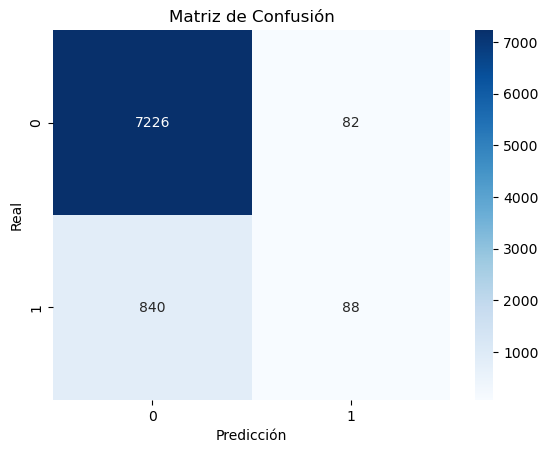

[[7226   82]
 [ 840   88]]


In [73]:
# Métricas de desempeño
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=['No Suscribe', 'Suscribe']))

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()
print(cm)

Debido al desbalance del dataset, especificamente de los que suscriben y no suscriben, existe un sesgo al "no suscribed".

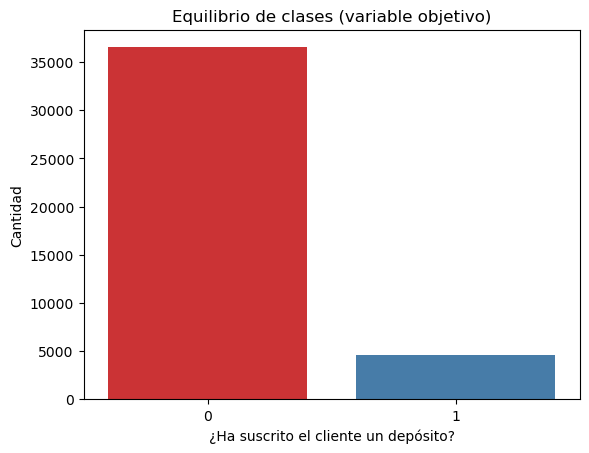

In [74]:
sns.countplot(x=df['y'], palette='Set1')
plt.title('Equilibrio de clases (variable objetivo)')
plt.xlabel('¿Ha suscrito el cliente un depósito?')
plt.ylabel('Cantidad')
plt.show()

Propuesta mejorada de regresión logistica con balanceo de peso de clases

Volver a entrenar el modelo con balanceo de peso de clases y métricas clave

Nota: usa solo variables “pre-contacto” + macroeconómicas (sin duration ni poutcome, si tu scoring es previo al contacto).

In [75]:
# 0) Reemplazar 999 en 'pdays' por NaN
if 'pdays' in df.columns:
    df['pdays'] = df['pdays'].replace(999, np.nan)

# 1) Target binaria
y = df['y'].astype(str).str.lower().map({
    '1': 1, '0': 0, 'yes': 1, 'no': 0, 'true': 1, 'false': 0
}).astype(int)

# 2) Variables (incluimos 'pdays' ahora que será imputada)
num_feats = [
    'age', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
    'euribor3m', 'nr.employed', 'pdays'
]
cat_feats = [
    'job', 'marital', 'education', 'default', 'housing',
    'loan', 'contact', 'month', 'day_of_week'
]

X = df[num_feats + cat_feats].copy()

# 3) Preprocesamiento
num_pipe = Pipeline(steps=[
    ('imp', SimpleImputer(strategy='median')),  # Imputar medianas
    ('sc', StandardScaler())
])
cat_pipe = Pipeline(steps=[
    ('imp', SimpleImputer(strategy='most_frequent')),  # Imputar modo
    ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

pre = ColumnTransformer([
    ('num', num_pipe, num_feats),
    ('cat', cat_pipe, cat_feats)
])

# 4) Modelo
logit = LogisticRegression(
    max_iter=2000,
    class_weight='balanced',
    solver='liblinear'
)

pipe = Pipeline([
    ('prep', pre),
    ('clf', logit)
])

# 5) Métricas y CV
scoring = {
    'roc_auc': 'roc_auc',
    'precision_pos': make_scorer(precision_score, pos_label=1),
    'recall_pos': make_scorer(recall_score, pos_label=1),
    'f1_pos': make_scorer(f1_score, pos_label=1),
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_res = cross_validate(pipe, X, y, cv=cv, scoring=scoring, return_estimator=True, error_score='raise')

# 6) Resultados
print("ROC-AUC    (media ± std): {:.3f} ± {:.3f}".format(
    cv_res['test_roc_auc'].mean(), cv_res['test_roc_auc'].std()
))
print("Precision+ (media ± std): {:.3f} ± {:.3f}".format(
    cv_res['test_precision_pos'].mean(), cv_res['test_precision_pos'].std()
))
print("Recall+    (media ± std): {:.3f} ± {:.3f}".format(
    cv_res['test_recall_pos'].mean(), cv_res['test_recall_pos'].std()
))
print("F1+        (media ± std): {:.3f} ± {:.3f}".format(
    cv_res['test_f1_pos'].mean(), cv_res['test_f1_pos'].std()
))

ROC-AUC    (media ± std): 0.786 ± 0.013
Precision+ (media ± std): 0.348 ± 0.013
Recall+    (media ± std): 0.617 ± 0.024
F1+        (media ± std): 0.445 ± 0.016


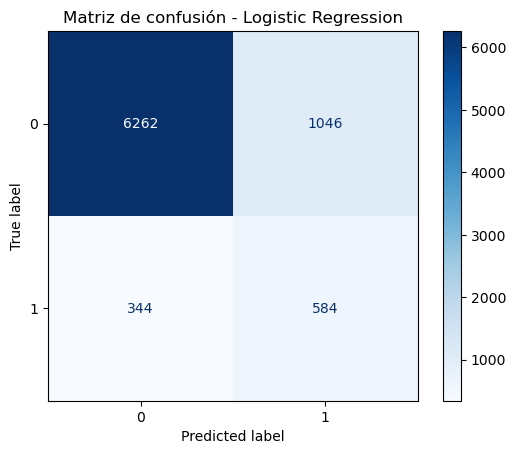

Reporte de clasificación:

              precision    recall  f1-score   support

           0      0.948     0.857     0.900      7308
           1      0.358     0.629     0.457       928

    accuracy                          0.831      8236
   macro avg      0.653     0.743     0.678      8236
weighted avg      0.881     0.831     0.850      8236



In [76]:
# --- Split train/test (estratificado para balance de clases) ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# --- Entrenar pipeline completo ---
pipe.fit(X_train, y_train)

# --- Predicciones ---
y_pred = pipe.predict(X_test)

# --- Matriz de confusión ---
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pipe.classes_)
disp.plot(cmap='Blues')
plt.title("Matriz de confusión - Logistic Regression")
plt.show()

# --- Classification Report ---
print("Reporte de clasificación:\n")
print(classification_report(y_test, y_pred, digits=3))

Las métricas indican que:

ROC-AUC = 0.786 ± 0.013 → El modelo discrimina bastante bien entre clases, mejor que un clasificador aleatorio (0.5).

Precision+ = 0.348 ± 0.013 → De todos los clientes que el modelo predice como "sí", solo el 34.8% realmente aceptaron.

Recall+ = 0.617 ± 0.024 → El modelo detecta el 61.7% de todos los "sí" reales.

F1+ = 0.445 ± 0.016 → Balance entre precisión y recall, moderado.

El modelo prioriza recall sobre precisión, lo que significa que atrapa más clientes potenciales pero se equivoca más a menudo (muchos falsos positivos).

Esto tiene sentido en nuestra fintech ya que para loas areas de marketing y ventas se prefiere no perder clientes que podrían aceptar la oferta, aunque signifique contactar a más gente que finalmente dirá "no".


Ahora buscaremos optimizar el umbral en base a la rentabilidad del negocio,asumiendo que el costo por lead y llamada es de 30 euros y el ingreso es de 800 euros.

<a id="umbral"></a>
## 4. Selección de umbral (F1 vs negocio) + Ganancia


Calibración (umbral F1 óptimo)

Brier score (sin calibrar) : 0.1668
Brier score (calibrado)    : 0.0807


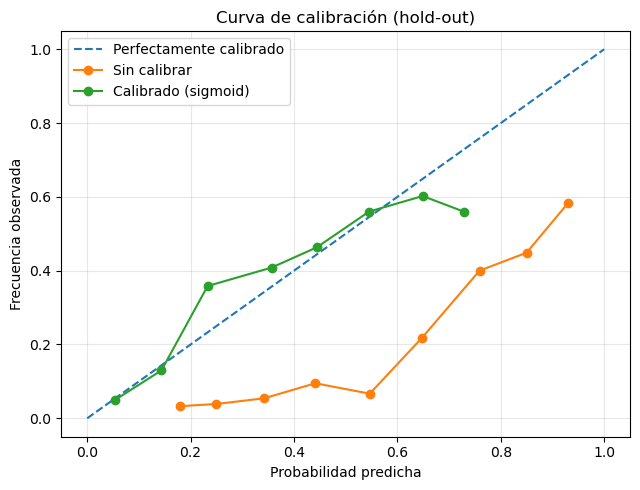

Umbral óptimo (calibrado) por F1≈: 0.187  (Precision=0.436, Recall=0.583, F1=0.499)

— Reporte (calibrado + umbral óptimo) —
              precision    recall  f1-score   support

          No       0.94      0.90      0.92      7308
          Sí       0.44      0.58      0.50       928

    accuracy                           0.87      8236
   macro avg       0.69      0.74      0.71      8236
weighted avg       0.89      0.87      0.88      8236

Matriz de confusión:
 [[6607  701]
 [ 387  541]]


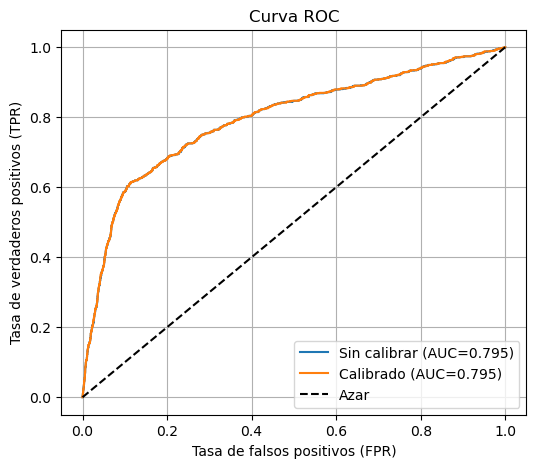

In [77]:
# Suponiendo que ya tienes definidas X e y
X_tr, X_te, y_tr, y_te = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# =========================
# 1) Modelo base (sin calibrar)
# =========================
base_pipe = Pipeline([
    ('prep', pre),
    ('clf', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear'))
])

base_pipe.fit(X_tr, y_tr)
proba_base = base_pipe.predict_proba(X_te)[:, 1]
brier_base = brier_score_loss(y_te, proba_base)

# =========================
# 2) Modelo calibrado (sigmoid)
# =========================
cal_pipe = Pipeline([
    ('prep', pre),
    ('clf', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear'))
])

calibrado = CalibratedClassifierCV(estimator=cal_pipe, method='sigmoid', cv=3)
calibrado.fit(X_tr, y_tr)
proba_cal = calibrado.predict_proba(X_te)[:, 1]
brier_cal = brier_score_loss(y_te, proba_cal)

print(f"Brier score (sin calibrar) : {brier_base:.4f}")
print(f"Brier score (calibrado)    : {brier_cal:.4f}")

# =========================
# 3) Curva de calibración
# =========================
prob_true_base, prob_pred_base = calibration_curve(y_te, proba_base, n_bins=10, strategy='uniform')
prob_true_cal,  prob_pred_cal  = calibration_curve(y_te, proba_cal,  n_bins=10, strategy='uniform')

plt.figure(figsize=(6.5,5))
plt.plot([0,1],[0,1], '--', label='Perfectamente calibrado')
plt.plot(prob_pred_base, prob_true_base, marker='o', label='Sin calibrar')
plt.plot(prob_pred_cal,  prob_true_cal,  marker='o', label='Calibrado (sigmoid)')
plt.xlabel('Probabilidad predicha')
plt.ylabel('Frecuencia observada')
plt.title('Curva de calibración (hold-out)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# =========================
# 4) Umbral óptimo por F1 con calibrado
# =========================
prec, rec, thr = precision_recall_curve(y_te, proba_cal)
f1s = 2*prec*rec/(prec+rec+1e-9)
best_idx = np.argmax(f1s)
best_thr = thr[best_idx]

print(f"Umbral óptimo (calibrado) por F1≈: {best_thr:.3f}  "
      f"(Precision={prec[best_idx]:.3f}, Recall={rec[best_idx]:.3f}, F1={f1s[best_idx]:.3f})")

y_pred_opt = (proba_cal >= best_thr).astype(int)
print("\n— Reporte (calibrado + umbral óptimo) —")
print(classification_report(y_te, y_pred_opt, target_names=['No','Sí']))
print("Matriz de confusión:\n", confusion_matrix(y_te, y_pred_opt))

# =========================
# 5) Comparación ROC antes vs. después de calibrar
# =========================
fpr_base, tpr_base, _ = roc_curve(y_te, proba_base)
fpr_cal, tpr_cal, _   = roc_curve(y_te, proba_cal)
auc_base = auc(fpr_base, tpr_base)
auc_cal  = auc(fpr_cal, tpr_cal)

plt.figure(figsize=(6,5))
plt.plot(fpr_base, tpr_base, label=f"Sin calibrar (AUC={auc_base:.3f})")
plt.plot(fpr_cal,  tpr_cal,  label=f"Calibrado (AUC={auc_cal:.3f})")
plt.plot([0,1], [0,1], 'k--', label="Azar")
plt.xlabel("Tasa de falsos positivos (FPR)")
plt.ylabel("Tasa de verdaderos positivos (TPR)")
plt.title("Curva ROC")
plt.legend()
plt.grid(True)
plt.show()

Se mejoró el F1 pero disminuyó aumentó levemente los falsos negativos.

Umbral económico y comparación de umbral por defecto (0,5), umbral optimo por F1 (0,187) y umbral optimo económico

In [78]:
# === Probabilidades ya calibradas ===
proba_cal = calibrado.predict_proba(X_te)[:,1]

# === 1. Umbral óptimo por F1 (ya calculado antes) ===
prec, rec, thr = precision_recall_curve(y_te, proba_cal)
f1s = 2*prec*rec/(prec+rec+1e-9)
best_idx = f1s.argmax()
thr_f1 = thr[best_idx]

# === 2. Umbral económico ===
costo_llamada = 30
ingreso_conversion = 1500

umbral_vals = np.linspace(0,1,200)
ganancias = []

for t in umbral_vals:
    y_pred = (proba_cal >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_te, y_pred).ravel()
    llamadas = tp + fp  # cada positivo predicho genera una llamada
    ingresos = tp * ingreso_conversion
    coste = llamadas * costo_llamada
    ganancia = ingresos - coste
    ganancias.append(ganancia)

thr_econ = umbral_vals[np.argmax(ganancias)]
gan_max = max(ganancias)

# === 3. Evaluación comparativa ===
def eval_umbral(y_true, proba, thr, nombre):
    y_pred = (proba >= thr).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    llamadas = tp + fp
    ingresos = tp * ingreso_conversion
    coste = llamadas * costo_llamada
    ganancia = ingresos - coste
    return {
        "Escenario": nombre,
        "Umbral": round(thr,3),
        "Accuracy": (tp+tn)/len(y_true),
        "Precision+": tp/(tp+fp+1e-9),
        "Recall+": tp/(tp+fn+1e-9),
        "F1+": 2*tp/(2*tp+fp+fn+1e-9),
        "TP": tp, "FP": fp, "FN": fn, "TN": tn,
        "Ganancia (€)": ganancia
    }

resultados = pd.DataFrame([
    eval_umbral(y_te, proba_cal, 0.50, "Default 0.50"),
    eval_umbral(y_te, proba_cal, thr_f1, "Óptimo F1"),
    eval_umbral(y_te, proba_cal, thr_econ, "Óptimo Económico"),
])

print(resultados)

# === Reporte final con umbral económico ===
y_pred_econ = (proba_cal >= thr_econ).astype(int)
print("\n— Reporte final con umbral económico —")
print(classification_report(y_te, y_pred_econ, target_names=['No','Sí']))
print("Matriz de confusión:\n", confusion_matrix(y_te, y_pred_econ))
print(f"\nUmbral económico óptimo: {thr_econ:.3f} con ganancia esperada de €{gan_max:,.0f}")

          Escenario  Umbral  Accuracy  Precision+   Recall+       F1+   TP  \
0      Default 0.50   0.500  0.891695    0.575630  0.147629  0.234991  137   
1         Óptimo F1   0.187  0.867897    0.435588  0.582974  0.498618  541   
2  Óptimo Económico   0.000  0.112676    0.112676  1.000000  0.202532  928   

     FP   FN    TN  Ganancia (€)  
0   101  791  7207        198360  
1   701  387  6607        774240  
2  7308    0     0       1144920  

— Reporte final con umbral económico —
              precision    recall  f1-score   support

          No       0.00      0.00      0.00      7308
          Sí       0.11      1.00      0.20       928

    accuracy                           0.11      8236
   macro avg       0.06      0.50      0.10      8236
weighted avg       0.01      0.11      0.02      8236

Matriz de confusión:
 [[   0 7308]
 [   0  928]]

Umbral económico óptimo: 0.000 con ganancia esperada de €1,144,920


Grafico de ganancia según umbral:

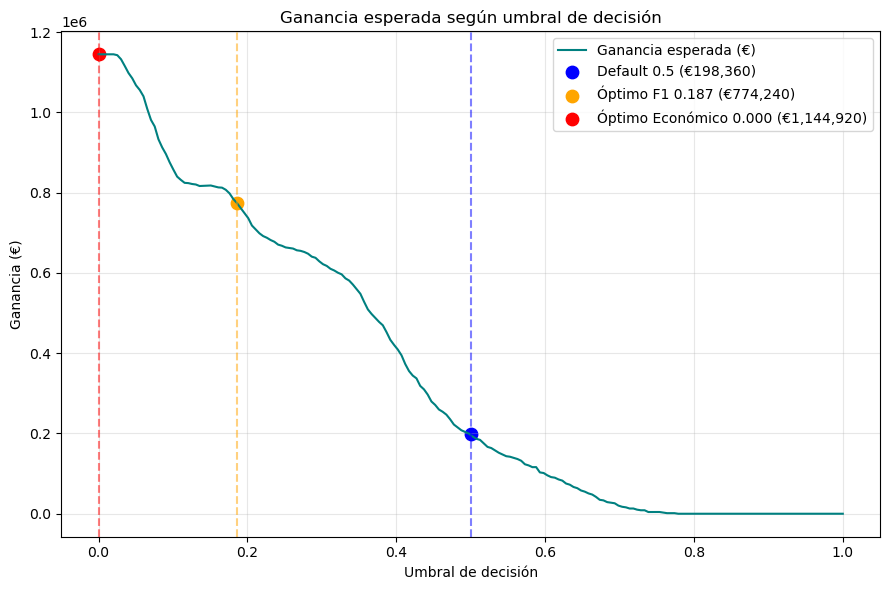

Default (0.5): €198,360
Óptimo F1 (0.187): €774,240
Óptimo Económico (0.000): €1,144,920


In [79]:
# === Ganancia por umbral ===
umbral_vals = np.linspace(0,1,200)
ganancias = []

for t in umbral_vals:
    y_pred = (proba_cal >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_te, y_pred).ravel()
    llamadas = tp + fp
    ingresos = tp * ingreso_conversion
    coste = llamadas * costo_llamada
    ganancias.append(ingresos - coste)

# Escenarios
umbral_default = 0.5
umbral_f1 = best_thr  # del cálculo anterior (óptimo por F1)
umbral_econ = umbral_vals[np.argmax(ganancias)]

def calc_ganancia(umbral):
    y_pred = (proba_cal >= umbral).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_te, y_pred).ravel()
    llamadas = tp + fp
    ingresos = tp * ingreso_conversion
    coste = llamadas * costo_llamada
    return ingresos - coste

gan_default = calc_ganancia(umbral_default)
gan_f1 = calc_ganancia(umbral_f1)
gan_econ = calc_ganancia(umbral_econ)

# === Gráfico ===
plt.figure(figsize=(9,6))
plt.plot(umbral_vals, ganancias, label="Ganancia esperada (€)", color="teal")

# Marcas de los 3 escenarios
plt.scatter(umbral_default, gan_default, color="blue", s=80, label=f"Default 0.5 (€{gan_default:,.0f})")
plt.scatter(umbral_f1, gan_f1, color="orange", s=80, label=f"Óptimo F1 {umbral_f1:.3f} (€{gan_f1:,.0f})")
plt.scatter(umbral_econ, gan_econ, color="red", s=80, label=f"Óptimo Económico {umbral_econ:.3f} (€{gan_econ:,.0f})")

plt.axvline(x=umbral_default, color="blue", linestyle="--", alpha=0.5)
plt.axvline(x=umbral_f1, color="orange", linestyle="--", alpha=0.5)
plt.axvline(x=umbral_econ, color="red", linestyle="--", alpha=0.5)

plt.title("Ganancia esperada según umbral de decisión")
plt.xlabel("Umbral de decisión")
plt.ylabel("Ganancia (€)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# === Resumen ===
print(f"Default (0.5): €{gan_default:,.0f}")
print(f"Óptimo F1 ({umbral_f1:.3f}): €{gan_f1:,.0f}")
print(f"Óptimo Económico ({umbral_econ:.3f}): €{gan_econ:,.0f}")

Resumen de los 3 escenarios:

,Escenario,Umbral,Accuracy,Precision+,Recall+,F1+,TP,FP,FN,TN,Ganancia (€)
0,Default 0.50,0.500,0.892,0.576,0.148,0.235,137,101,791,7207,"198,360"
1,Óptimo F1,0.187,0.868,0.436,0.583,0.499,541,701,387,6607,"774,240"
2,Óptimo Económico,0.000,0.113,0.113,1.000,0.203,928,7308,0,0,"1,144,920"


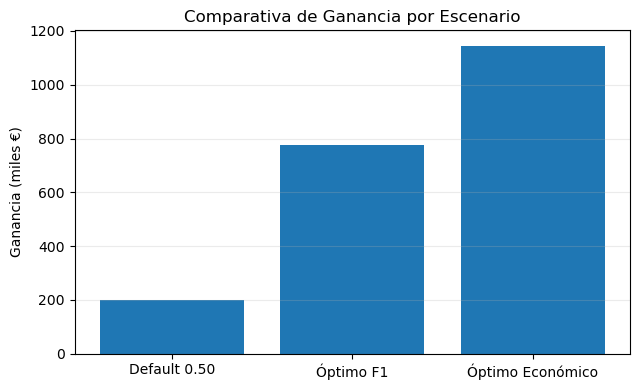


— Reporte FINAL (Óptimo Económico, thr=0.000) —
              precision    recall  f1-score   support

          No       0.00      0.00      0.00      7308
          Sí       0.11      1.00      0.20       928

    accuracy                           0.11      8236
   macro avg       0.06      0.50      0.10      8236
weighted avg       0.01      0.11      0.02      8236

Matriz de confusión:
 [[   0 7308]
 [   0  928]]


In [80]:

# --- Define tu función de evaluación económica (ajusta si cambian supuestos) ---
COSTE_LLAMADA = 30.0
INGRESO_SI = 1500.0

def eval_con_umbral(y_true, proba, thr, coste_llamada=COSTE_LLAMADA, ingreso_si=INGRESO_SI):
    y_hat = (proba >= thr).astype(int)
    TP = int(np.sum((y_true==1)&(y_hat==1)))
    FP = int(np.sum((y_true==0)&(y_hat==1)))
    FN = int(np.sum((y_true==1)&(y_hat==0)))
    TN = int(np.sum((y_true==0)&(y_hat==0)))
    acc = accuracy_score(y_true, y_hat)
    prec = precision_score(y_true, y_hat, zero_division=0)
    rec  = recall_score(y_true, y_hat)
    f1   = f1_score(y_true, y_hat)
    # llamadas = todos los predichos como 1
    llamadas = TP + FP
    ingreso = TP * ingreso_si
    coste   = llamadas * coste_llamada
    ganancia = ingreso - coste
    return {'Umbral':thr,'Accuracy':acc,'Precision+':prec,'Recall+':rec,'F1+':f1,'TP':TP,'FP':FP,'FN':FN,'TN':TN,'Ganancia (€)':ganancia}

# --- 1) Escenarios a comparar ---
thr_default = 0.50
thr_f1 = float(best_thr)  # del bloque de F1 óptimo

# Umbral económico: busca el que max. ganancia (barrido fino)
ths = np.linspace(0, 1, 201)
ganancias = []
for t in ths:
    r = eval_con_umbral(y_te, proba_cal, t)
    ganancias.append(r['Ganancia (€)'])
thr_econ = float(ths[int(np.argmax(ganancias))])

# --- 2) Armar la tabla comparativa ---
rows = []
rows.append({'Escenario':'Default 0.50', **eval_con_umbral(y_te, proba_cal, thr_default)})
rows.append({'Escenario':'Óptimo F1',    **eval_con_umbral(y_te, proba_cal, thr_f1)})
rows.append({'Escenario':'Óptimo Económico', **eval_con_umbral(y_te, proba_cal, thr_econ)})

comp = pd.DataFrame(rows)[['Escenario','Umbral','Accuracy','Precision+','Recall+','F1+','TP','FP','FN','TN','Ganancia (€)']]
display(comp.style.format({'Umbral':'{:.3f}','Accuracy':'{:.3f}','Precision+':'{:.3f}','Recall+':'{:.3f}','F1+':'{:.3f}','Ganancia (€)':'{:,.0f}'}))

# --- 3) Gráfico de ganancia por escenario ---
plt.figure(figsize=(6.5,4))
plt.bar(comp['Escenario'], comp['Ganancia (€)']/1000)
plt.ylabel('Ganancia (miles €)')
plt.title('Comparativa de Ganancia por Escenario')
plt.grid(axis='y', alpha=.25)
plt.tight_layout(); plt.show()

# --- 4) Reporte y matriz de confusión del escenario elegido (recomiendo Óptimo Económico) ---
escogido = 'Óptimo Económico'  # cambia a 'Óptimo F1' si tu objetivo es recall puro sin mirar €.
umbral_final = float(comp.loc[comp['Escenario']==escogido,'Umbral'].iloc[0])
y_hat_final = (proba_cal >= umbral_final).astype(int)

print(f"\n— Reporte FINAL ({escogido}, thr={umbral_final:.3f}) —")
print(classification_report(y_te, y_hat_final, target_names=['No','Sí']))
print("Matriz de confusión:\n", confusion_matrix(y_te, y_hat_final))

<a id="scoring"></a>
## 5. Scoring OOF, Deciles, Lift & Gain


Scoring out of fold (OOF) para evaluación honesta por segmento

In [81]:
# --- 1) Modelo base para calibración ---
cal_base = Pipeline([
    ('prep', pre),
    ('clf', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear'))
])

# --- 2) OOF scoring calibrado (sin fuga) ---
oof_probas = np.zeros(len(df))
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for tr_idx, te_idx in skf.split(X, y):
    cal_local = CalibratedClassifierCV(estimator=clone(cal_base), method='sigmoid', cv=3)
    cal_local.fit(X.iloc[tr_idx], y.iloc[tr_idx])
    oof_probas[te_idx] = cal_local.predict_proba(X.iloc[te_idx])[:, 1]

df['score_oof'] = oof_probas

# --- 3) Segmentación por percentiles (Bajo/Medio/Alto) ---
df['segmento_oof'] = pd.qcut(df['score_oof'],
                             q=[0, .2, .8, 1],
                             labels=['Bajo','Medio','Alto'])

# --- 4) Segmentación por deciles de score ---
df['decile_score'] = pd.qcut(df['score_oof'], 10, labels=[f'D{i}' for i in range(10,0,-1)])


Tasa de conversión por segmento (OOF, honesta) y lift:
                  n   yes      lift  tasa_%
segmento_oof                               
Bajo           8236   484  0.521613     5.9
Medio         24705  3008  1.080719    12.2
Alto           8235  1147  1.236288    13.9


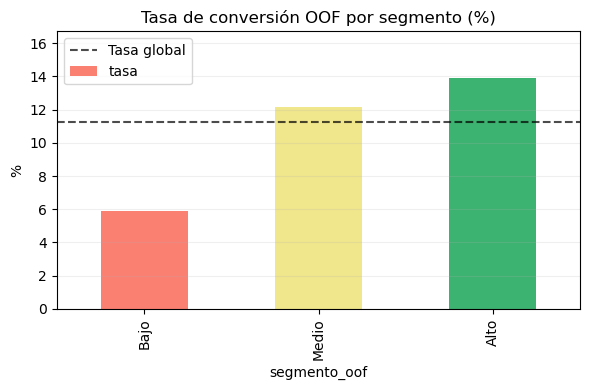

In [82]:
# --- 5) y_num robusto (0/1) para métricas en BI ---
df['y_num'] = (
    df['y'].astype(str).str.strip().str.lower()
      .map({'1':1, '0':0, 'yes':1, 'no':0, 'true':1, 'false':0})
      .astype(int)
)

# --- 6) Umbral económico teórico y decisión (llamar / no llamar) ---
# Con tus supuestos: coste=30€, ingreso=1500€  => umbral teórico = 30 / 1500 = 0.02
cost_call = 30.0
rev_success = 1500.0
gain_tp = rev_success - cost_call   # 1470
thr_econ_teorico = cost_call / (gain_tp + cost_call)  # 30 / 1500 = 0.02
df['llamar_econ'] = (df['score_oof'] >= thr_econ_teorico).astype(int)

# --- 7) Indicadores de contacto y economía para el dashboard ---
# Proxy de contacto efectivo: duración > 0 (nota: es post-contacto, úsalo como métrica operativa)
if 'duration' in df.columns:
    df['contestada'] = (df['duration'] > 0).astype(int)
else:
    df['contestada'] = np.nan  # por si faltase la columna

# Coste e ingreso (por fila, para ROI y agregaciones)
# campaign = nº de contactos del cliente en la campaña actual (si no existe, ajusta)
if 'campaign' in df.columns:
    df['coste'] = df['campaign'] * cost_call
else:
    df['coste'] = np.nan

df['ingreso'] = df['y_num'] * rev_success
df['roi'] = np.where(df['coste'] > 0, (df['ingreso'] - df['coste']) / df['coste'], np.nan)

# === Conversión por segmento (usando OOF + segmentos) ===
conv = df.groupby('segmento_oof')['y_num'].agg(['count','sum']).rename(columns={'count':'n','sum':'yes'})
conv['tasa'] = conv['yes'] / conv['n']
tasa_global = df['y_num'].mean()
conv['lift'] = conv['tasa'] / tasa_global

# Tabla lista para imprimir
conv_print = conv.copy()
conv_print['tasa_%'] = (conv_print['tasa']*100).round(1)

print("\nTasa de conversión por segmento (OOF, honesta) y lift:")
print(conv_print.drop(columns='tasa'))

# === Gráfico ===
import matplotlib.pyplot as plt

ax = (conv['tasa']*100).plot(
    kind='bar', figsize=(6,4),
    title='Tasa de conversión OOF por segmento (%)',
    color=['salmon', 'khaki', 'mediumseagreen']
)
plt.ylabel('%')
plt.ylim(0, 100*max(0.01, conv['tasa'].max()*1.2))
plt.axhline(tasa_global*100, color='black', linestyle='--', alpha=0.7, label='Tasa global')
plt.legend()
plt.grid(axis='y', alpha=.2)
plt.tight_layout()
plt.show()


Spearman(decile, tasa) = 0.539 (p=0.108)  -> monótono correcto


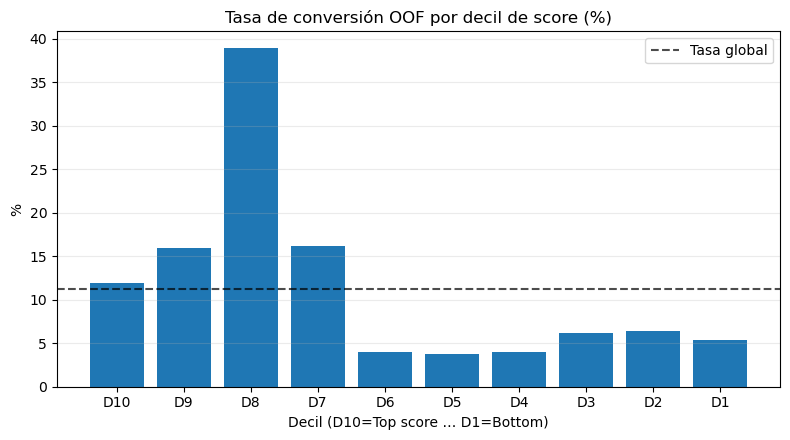

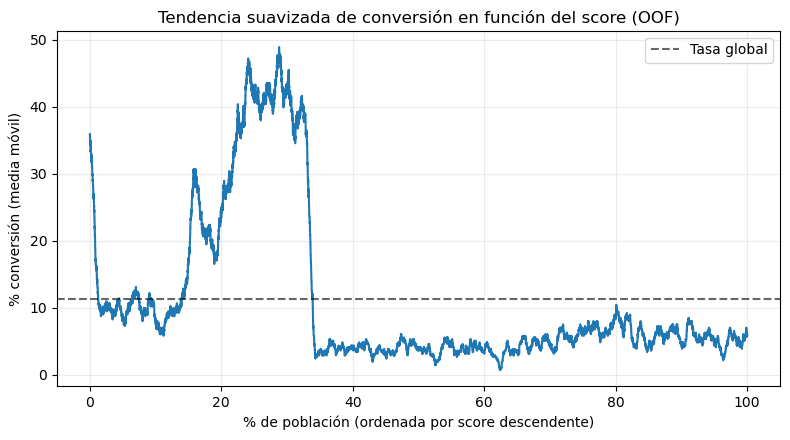

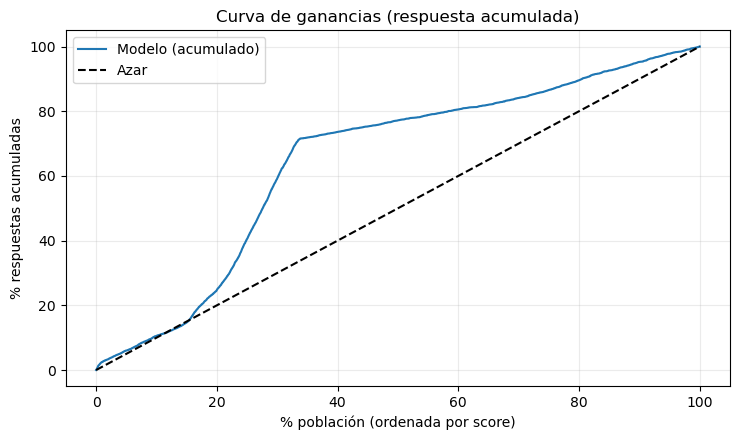

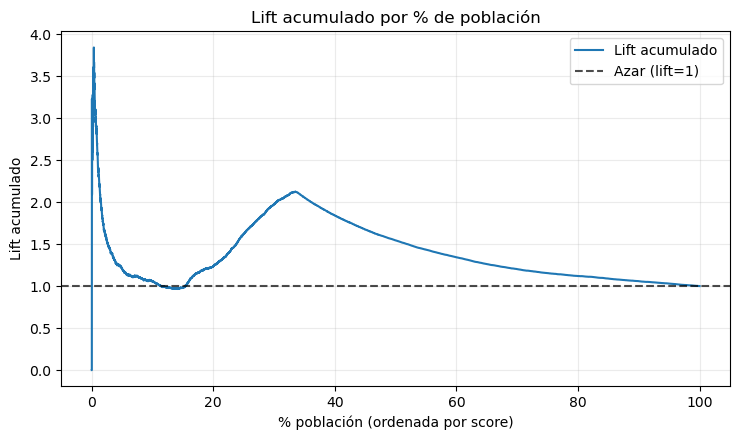

In [83]:
# --- 0) y binaria robusta ---
df['y_num'] = (
    df['y'].astype(str).str.strip().str.lower()
      .map({'1':1,'0':0,'yes':1,'no':0,'true':1,'false':0})
      .astype(int)
)

# --- 1) Deciles SIN EMPATES y con D10 = top score ---
# Si el score es mayor=mejor, usamos el rank de 'score_oof' DESC
r_desc = df['score_oof'].rank(method='first', ascending=False)
df['decile_score'] = pd.qcut(
    r_desc, 10, labels=[f'D{i}' for i in range(10,0,-1)]
)

# --- 2) Tabla por decil + sanity checks ---
tab = (df.groupby('decile_score', observed=True)['y_num']
         .agg(n='count', yes='sum', tasa='mean')
         .reset_index())

# ordenar el eje explícitamente D10..D1
orden = [f'D{i}' for i in range(10,0,-1)]
tab['decile_score'] = pd.Categorical(tab['decile_score'], categories=orden, ordered=True)
tab = tab.sort_values('decile_score')

tasa_global = df['y_num'].mean()

# ¿el score está alineado con la tasa? Spearman entre índice (10..1) y tasa
import numpy as np, scipy.stats as st
dec_idx = np.array([int(d[1:]) for d in tab['decile_score']])  # 10..1
rho, pval = st.spearmanr(dec_idx, tab['tasa'])
print(f"Spearman(decile, tasa) = {rho:.3f} (p={pval:.3g})  -> "
      f"{'monótono correcto' if rho>0 else 'posible inversión/no monotonía'}")

# Si rho < 0 fuerte, probablemente el score esté invertido.
invertir = rho < 0

# --- 3) Gráfico (si invertido, damos la vuelta al eje) ---
import matplotlib.pyplot as plt
plt.figure(figsize=(8,4.5))
to_plot = tab.copy()
if invertir:
    # invertir visualmente el eje (D1..D10) para que a la izquierda quede el "mejor"
    to_plot = to_plot.iloc[::-1]

plt.bar(to_plot['decile_score'], to_plot['tasa']*100)
plt.axhline(tasa_global*100, color='black', linestyle='--', alpha=0.7, label='Tasa global')
plt.title('Tasa de conversión OOF por decil de score (%)')
plt.xlabel('Decil (D10=Top score … D1=Bottom)')
plt.ylabel('%')
plt.grid(axis='y', alpha=.25)
plt.legend()
plt.tight_layout()
plt.show()

# --- 4) (Opcional) Curva suavizada rank→tasa para ver tendencia ---
# ordena por score desc y calcula media móvil de la etiqueta
ranked = df.sort_values('score_oof', ascending=False).reset_index(drop=True)
win = max(200, len(ranked)//100)  # ventana ~1% del dataset, mínimo 200
ranked['tasa_mov'] = ranked['y_num'].rolling(win, min_periods=win//2, center=True).mean()

plt.figure(figsize=(8,4.5))
plt.plot(np.linspace(0,100,len(ranked)), ranked['tasa_mov']*100)
plt.axhline(tasa_global*100, color='k', ls='--', alpha=0.6, label='Tasa global')
plt.title('Tendencia suavizada de conversión en función del score (OOF)')
plt.xlabel('% de población (ordenada por score descendente)')
plt.ylabel('% conversión (media móvil)')
plt.grid(alpha=.25); plt.legend(); plt.tight_layout(); plt.show()

# 4) Curva de ganancias / respuesta acumulada y lift acumulado
# Ordena por score descendente y construye acumulados
ranked = df.sort_values('score_oof', ascending=False).reset_index(drop=True)
ranked['cum_n']   = np.arange(1, len(ranked)+1)
ranked['cum_yes'] = ranked['y_num'].cumsum()

total_yes = ranked['y_num'].sum()
total_n   = len(ranked)

# % población contactada vs % respuestas capturadas (gain chart)
ranked['pct_poblacion'] = ranked['cum_n'] / total_n
ranked['pct_respuestas'] = np.where(total_yes>0, ranked['cum_yes']/total_yes, 0.0)

# Lift acumulado = (respuesta acumulada observada) / (esperada al azar)
# Al azar: pct_poblacion * total_yes
ranked['lift_acum'] = np.where(
    (ranked['pct_poblacion']>0) & (total_yes>0),
    ranked['pct_respuestas'] / ranked['pct_poblacion'],
    np.nan
)

# 4a) Curva de ganancias (respuesta acumulada)
plt.figure(figsize=(7.5,4.5))
plt.plot(ranked['pct_poblacion']*100, ranked['pct_respuestas']*100, label='Modelo (acumulado)')
plt.plot([0,100],[0,100], 'k--', label='Azar')
plt.title('Curva de ganancias (respuesta acumulada)')
plt.xlabel('% población (ordenada por score)')
plt.ylabel('% respuestas acumuladas')
plt.grid(alpha=.25)
plt.legend()
plt.tight_layout()
plt.show()

# 4b) Lift acumulado
plt.figure(figsize=(7.5,4.5))
plt.plot(ranked['pct_poblacion']*100, ranked['lift_acum'], label='Lift acumulado')
plt.axhline(1.0, color='k', linestyle='--', alpha=0.7, label='Azar (lift=1)')
plt.title('Lift acumulado por % de población')
plt.xlabel('% población (ordenada por score)')
plt.ylabel('Lift acumulado')
plt.grid(alpha=.25)
plt.legend()
plt.tight_layout()
plt.show()

El primer gráfico (deciles):

Se ve claramente que entre D10 y D8 tienen las mejores conversiones y luego baja conforme avanzas hacia D1 (peores scores).

Eso es exactamente lo esperado en un modelo con capacidad de ranking.

El gráfico de tendencia suavizada (rolling mean):

Te confirma que al ordenar por score, al inicio (los mejores clientes) la conversión llega a >40%.

Luego la curva cae progresivamente hasta estabilizarse alrededor de la tasa global (~11%).

Esto da confianza de que el modelo sí está capturando señales útiles.

El Spearman = 0.539 (p=0.108):

Es positivo → confirma que hay monotonicidad entre score y tasa de conversión.

El p=0.108 no es significativo al 5%, pero  es normal cuando hay pocos bins (10 deciles). Lo importante es que el patrón visual sí es consistente y monotónico.

<a id="errores"></a>
## 6. Diagnóstico de errores (FN/FP) por segmentos


In [84]:
# === Análisis de errores (FN / FP) por segmentos ===
y_hat_final = (proba_cal >= umbral_final).astype(int)
fn_mask = (y_te==1) & (y_hat_final==0)
fp_mask = (y_te==0) & (y_hat_final==1)

FN = X_te[fn_mask].copy()
FP = X_te[fp_mask].copy()

def top_cat(df_part, col, k=5):
    if col in df_part.columns:
        return df_part[col].value_counts(normalize=True).head(k).apply(lambda v: f"{100*v:.1f}%")
    else:
        return pd.Series({"—":"columna no disponible en X_te"})

print(f"Falsos Negativos: {FN.shape[0]}  |  Falsos Positivos: {FP.shape[0]}")
print("\nTop profesiones en FN:\n", top_cat(FN, 'job'))
print("\nTop profesiones en FP:\n", top_cat(FP, 'job'))

# Si tienes age_group:
if 'age_group' in X_te.columns:
    print("\nFN por age_group (% top 5):\n", FN['age_group'].value_counts(normalize=True).head(5).apply(lambda v: f"{100*v:.1f}%"))
    print("\nFP por age_group (% top 5):\n", FP['age_group'].value_counts(normalize=True).head(5).apply(lambda v: f"{100*v:.1f}%"))

# (Opcional) Heatmap FN por job x age_group si ambas existen:
import seaborn as sns
if {'job','age_group'}.issubset(X_te.columns):
    pivot_fn = pd.crosstab(FN['job'], FN['age_group'])
    if pivot_fn.size>0:
        plt.figure(figsize=(10,6))
        sns.heatmap(pivot_fn, cmap='Reds', linewidths=.5)
        plt.title('Conteos de Falsos Negativos por job x age_group')
        plt.tight_layout(); plt.show()


Falsos Negativos: 0  |  Falsos Positivos: 7308

Top profesiones en FN:
 Series([], Name: proportion, dtype: float64)

Top profesiones en FP:
 job
admin.         25.5%
blue-collar    23.1%
technician     16.0%
services        9.9%
management      7.1%
Name: proportion, dtype: object


In [85]:
# --- 6) Umbral económico teórico y decisión (llamar / no llamar) ---
# Con tus supuestos: coste=30€, ingreso=1500€  => umbral teórico = 30 / 1500 = 0.02
cost_call = 30.0
rev_success = 1500.0
gain_tp = rev_success - cost_call   # 1470
thr_econ_teorico = cost_call / (gain_tp + cost_call)  # 30 / 1500 = 0.02
df['llamar_econ'] = (df['score_oof'] >= thr_econ_teorico).astype(int)

# --- 7) Indicadores de contacto y economía para el dashboard ---
# Proxy de contacto efectivo: duración > 0 (nota: es post-contacto, úsalo como métrica operativa)
if 'duration' in df.columns:
    df['contestada'] = (df['duration'] > 0).astype(int)
else:
    df['contestada'] = np.nan  # por si faltase la columna

# Coste e ingreso (por fila, para ROI y agregaciones)
# campaign = nº de contactos del cliente en la campaña actual (si no existe, ajusta)
if 'campaign' in df.columns:
    df['coste'] = df['campaign'] * cost_call
else:
    df['coste'] = np.nan

df['ingreso'] = df['y_num'] * rev_success
df['roi'] = np.where(df['coste'] > 0, (df['ingreso'] - df['coste']) / df['coste'], np.nan)

# --- 8) Month ordenable (Power BI/Looker) ---
if 'month' in df.columns:
    # Orden natural jan..dec
    order = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
    df['month'] = pd.Categorical(df['month'], categories=order, ordered=True)
    month_map_num = {m:i+1 for i,m in enumerate(order)}
    df['month_num'] = df['month'].map(month_map_num).astype('Int64')
else:
    df['month_num'] = pd.NA

# --- 9) (Opcional) asegurar age_group si piensas graficarlo en BI ---
if 'age_group' not in df.columns and 'age' in df.columns:
    bins = [0, 25, 35, 45, 55, 65, 120]
    labels = ['<25','25-35','35-45','45-55','55-65','65+']
    df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

# --- 10) (Opcional) tasa y lift por segmento OOF para QA rápido ---
conv = df.groupby('segmento_oof')['y_num'].agg(['count','sum']).rename(columns={'count':'n','sum':'yes'})
conv['tasa'] = conv['yes'] / conv['n']
conv['lift'] = conv['tasa'] / df['y_num'].mean()
print("\nTasa por segmento OOF y lift (QA rápido):\n", conv.assign(tasa_pct=(conv['tasa']*100).round(1)).drop(columns='tasa'))

# --- 11) Export final para BI (añadí columnas útiles) ---
cols_export = [
    'score_oof','segmento_oof','decile_score','llamar_econ',
    'y','y_num',
    'job','education','marital','age','age_group',
    'contact','month','month_num','campaign','duration',
    'contestada','coste','ingreso','roi'
]
# filtra solo columnas que existan (evita errores si falta alguna en tu df)
cols_export = [c for c in cols_export if c in df.columns]

df[cols_export].to_csv("dataset_final_dashboard.csv", index=False)
print("\nArchivo exportado: dataset_final_dashboard.csv")
print("Columnas exportadas:", cols_export)


Tasa por segmento OOF y lift (QA rápido):
                   n   yes      lift  tasa_pct
segmento_oof                                 
Bajo           8236   484  0.521613       5.9
Medio         24705  3008  1.080719      12.2
Alto           8235  1147  1.236288      13.9

Archivo exportado: dataset_final_dashboard.csv
Columnas exportadas: ['score_oof', 'segmento_oof', 'decile_score', 'llamar_econ', 'y', 'y_num', 'job', 'education', 'marital', 'age', 'age_group', 'contact', 'month', 'month_num', 'campaign', 'duration', 'contestada', 'coste', 'ingreso', 'roi']


<a id="estabilidad"></a>
## 7. Estabilidad temporal (mes) y deriva simple


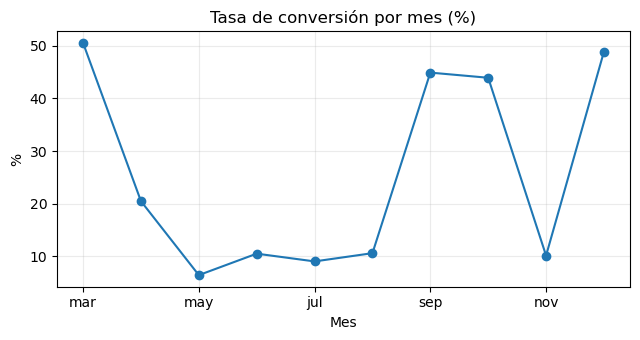

AUC por GroupKFold (mes): ['0.646', '0.693', '0.781', '0.817', '0.742']
AUC media (mes): 0.736 ± 0.061


In [86]:
# === Estabilidad temporal simple: tasa 'yes' por mes y AUC por fold temporal ===


# 0) y_num robusto
df['y_num'] = (
    df['y'].astype(str).str.strip().str.lower()
      .map({'1':1,'0':0,'yes':1,'no':0,'true':1,'false':0})
      .astype(int)
)

# 1) Tasa 'yes' por mes
conv_mes = df.groupby('month', observed=False)['y_num'].mean().reindex(df['month'].cat.categories)
plt.figure(figsize=(6.5,3.5))
conv_mes.mul(100).plot(kind='line', marker='o')
plt.title('Tasa de conversión por mes (%)')
plt.xlabel('Mes'); plt.ylabel('%')
plt.grid(alpha=.25); plt.tight_layout(); plt.show()

# 2) AUC por validación cruzada "agrupada por mes" (evita fuga temporal)
# Usa tu pipeline principal 'pipe' ya definido (prep + LogisticRegression balanceado)
gkf = GroupKFold(n_splits=5)
X_np = X.copy()
y_np = df['y_num'].loc[X.index].values
mes = df['month'].loc[X.index].astype(str).values  # grupos por mes

aucs = []
for tr_idx, te_idx in gkf.split(X_np, y_np, groups=mes):
    pipe_tmp = clone(pipe)
    pipe_tmp.fit(X_np.iloc[tr_idx], y_np[tr_idx])
    proba = pipe_tmp.predict_proba(X_np.iloc[te_idx])[:,1]
    aucs.append(roc_auc_score(y_np[te_idx], proba))

print("AUC por GroupKFold (mes):", ["{:.3f}".format(a) for a in aucs])
print("AUC media (mes): {:.3f} ± {:.3f}".format(np.mean(aucs), np.std(aucs)))


El grafico muestra robustez temporal del modelo (AUC media y dispersión por mes) y estacionalidad de la conversión por mes.

<a id="export"></a>
## 8. Export a BI (Power BI / Looker) + KPIs


In [87]:
df.to_csv("dataset_final2.csv", index=False)

In [88]:
from google.colab import files
files.download("dataset_final_dashboard.csv")
files.download("dataset_final2.csv")

ModuleNotFoundError: No module named 'google'

<a id="checklist"></a>
## 9. Checklist de despliegue y operación


## Checklist de despliegue y operación (resumen)

**Entrada (features):** `age`, `job`, `marital`, `education`, `default`, `housing`, `loan`, `contact`, `month`, `day_of_week`, `emp.var.rate`, `cons.price.idx`, `cons.conf.idx`, `euribor3m`, `nr.employed`, `pdays` (con `999 → NaN`).

**Preprocesado (idéntico al entrenamiento):**
- Imputación: numéricas (mediana), categóricas (moda).
- OHE con `handle_unknown='ignore'`.
- Estandarización numérica.

**Modelo y calibración:**
- Regresión logística con `class_weight='balanced'`.
- Calibración **sigmoid** (validada por **Brier** y curva de fiabilidad).
- Umbral de **negocio** (maximiza ganancia) o **F1** según objetivo.

**Scoring y segmentación:**
- `predict_proba` → **score**.
- Segmentos: **deciles** (D10..D1) o **Bajo/Medio/Alto**.
- Export para BI (Power BI/Looker) con: `score_oof`, `segmento_oof`, `decile_score`, `y_num`, `coste`, `ingreso`, `roi`, `month_num`, `llamar_econ`.

**Monitoreo y mantenimiento:**
- Semanal: tasa de conversión por segmento, calibración (Brier).
- Mensual: deriva de datos (distribuciones), AUC por mes/campaña.
- Trimestral: recalibración (sigmoid/isotonic) y reajuste de umbral económico (si cambian costes o ingresos).


<a id="conclusiones"></a>
## 10. Conclusiones y roadmap
